# Modern Data Analytics (Team - Switzerland)

**Team Switzerland** is pleased to show our final group assignment!
  
  
Topic: [Eurovision](https://eurovision.tv/)

The Eurovision Song Contest is an international songwriting competition organized annually be the European Broadcasting Union. Its cultural influence is undoubtedly massive especially in Europe.

Despite the structured scoring systems, there has been doubts that the scoring between the participating countries is somehow biased. A lot of researchers from a variety of sectors have attempted to answer this question from different perspectives. The examples are as follows:
- ["The Eurovision Song Contest. Is voting political or cultural?"](https://www.sciencedirect.com/science/article/pii/S0176268007000547), Ginsburgh V, Noury A. (2008).
- ["The multilevel identity politics of the 2019 Eurovision Song Contest"](https://www.researchgate.net/publication/340075891_The_multilevel_identity_politics_of_the_2019_Eurovision_Song_Contest), Press-Barnathan, G., & Lutz, N. (2020).
- ["The Winner Takes It All: Investor Sentiment and the Eurovision Song Contest"](https://www.sciencedirect.com/science/article/pii/S0378426622000322), Abudy, M. M., Mugerman, Y., & Shust, E. (2022).

In this data science project, we aim at analyzing the Eurovision scoring system from multiple point of views. These views are divided into the following **THREE BUCKETS**:
- **ECONOMIC**
 - Can *ECONOMICAL FEATURES* help predict scores?
- **SONGS**
 - Can *SONGS' FEATURES* help predict scores?
- **GRAPHS**
 - What are the *GRAPHICAL INTERPRETATIONS* of scoring systems?

## Table of contents

* [Eurovision EDA](#EDA)
* [Eurovision ECONOMIC - EXEXE](#economic)
 * [Supervised ML](#supML)
 * [Unsupervised ML](#unsupML)
* [Eurovision SONGS](#songs)
 * [Visualization](#viz)
 * [Supervised ML](#supML_song)
 * [Sentiment Analysis](#SA)
* [Eurovision GRAPHS](#graphs)
 * [Graph Algorithms](#GA)

# Eurovision EDA
<a name='eurovisionds'></a>


First, we are going to conduct some basic exploratory data analysis of the Eurovision scoring history.

In [145]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [146]:
import os
cwd = os.getcwd()
# Print the current working directory
print("Current working directory: {0}".format(cwd))

Current working directory: C:\Users\gunho


In [147]:
df = pd.read_csv('./mda_switzerland/data/bucket0_eurovision.csv')#, index_col = 'Year')

In [148]:
df.tail()

,Year,(semi-) final,Edition,Jury or Televoting,From country,To country,Points,Duplicate
49827,2019,f,2019f,J,Belarus,Greece,0,NaN
49828,2019,f,2019f,J,Belarus,Germany,8,NaN
49829,2019,f,2019f,J,Belarus,Belarus,0,x
49830,2019,f,2019f,J,Belarus,The Netherlands,0,NaN
49831,2019,f,2019f,J,Belarus,Russia,0,NaN


In [149]:
print(df.head())
df['From country'].unique()

   Year (semi-) final Edition Jury or Televoting From country To country  \
0  1975             f   1975f                  J      Belgium    Belgium   
1  1975             f   1975f                  J      Belgium    Finland   
2  1975             f   1975f                  J      Belgium     France   
3  1975             f   1975f                  J      Belgium    Germany   
4  1975             f   1975f                  J      Belgium    Ireland   

   Points       Duplicate  
0             0         x  
1             0       NaN  
2             2       NaN  
3             0       NaN  
4            12       NaN  


array(['Belgium', 'Finland', 'France', 'Germany', 'Ireland', 'Israel',
       'Italy', 'Luxembourg', 'Malta', 'Monaco', 'Norway', 'Portugal',
       'Spain', 'Sweden', 'Switzerland', 'The Netherlands', 'Turkey',
       'United Kingdom', 'Yugoslavia', 'Austria', 'Greece', 'Denmark',
       'Morocco', 'Cyprus', 'Iceland', 'Bosnia & Herzegovina', 'Croatia',
       'Slovenia', 'Estonia', 'Hungary', 'Lithuania', 'Poland', 'Romania',
       'Russia', 'Slovakia', 'F.Y.R. Macedonia', 'Latvia', 'Ukraine',
       'Albania', 'Andorra', 'Belarus', 'Serbia & Montenegro', 'Bulgaria',
       'Moldova', 'Armenia', 'Czech Republic', 'Georgia', 'Montenegro',
       'Serbia', 'Azerbaijan', 'San Marino', 'Australia', 'Macedonia',
       'The Netherands', 'North Macedonia'], dtype=object)

For consistency, we need to manipulate some values.

In [150]:
df.rename(columns={'Points      ': "Points"}, inplace=True)
df.replace('The Netherands', 'TheNetherlands', inplace=True)
df.replace('United Kingdom', 'UnitedKingdom', inplace=True)
df.replace('San Marino', 'SanMarino', inplace=True)
df.replace(['F.Y.R. Macedonia', 'Macedonia'], 'NorthMacedonia', inplace=True)
df.replace(['Bosnia & Herzegovina'], 'BosniaandHerzegovina', inplace=True)
df.replace(['Serbia & Montenegro'], 'SerbiaandMontenegro', inplace=True)
df.replace(['Czech Republic'], 'Czech Republic', inplace=True)

In [151]:
len(df['From country'].unique())

54

Now we aggregate the data by 'Year' and 'To country'

In [152]:
df.groupby(['Year', 'To country']).sum()

Points
Year To country             
1975 Belgium              17
     Finland              74
     France               91
     Germany              15
     Ireland              68
...                      ...
2019 Spain                58
     Sweden              565
     Switzerland         588
     The Netherlands     771
     UnitedKingdom        14

[1274 rows x 1 columns]

In [153]:
#12 and 0
df_twelve = df[df['Points'] == 12][['Jury or Televoting', 'From country', 'To country', 'Points']]
df_zero = df[df['Points'] == 0][['Jury or Televoting', 'From country', 'To country', 'Points']]

In [156]:
df_twelve['To country'].value_counts()

Sweden                  157
Russia                  108
Greece                   89
Norway                   81
Denmark                  81
Ukraine                  74
Ireland                  73
Portugal                 67
The Netherlands          65
Serbia                   64
UnitedKingdom            64
Cyprus                   63
Italy                    61
Turkey                   60
Israel                   58
Germany                  57
Armenia                  57
Azerbaijan               57
Belgium                  51
BosniaandHerzegovina     49
Romania                  49
France                   49
Austria                  48
Estonia                  42
Moldova                  41
Switzerland              39
Bulgaria                 38
Australia                38
Iceland                  37
Albania                  35
Spain                    35
Malta                    32
Lithuania                32
Finland                  30
Latvia                   29
Hungary             

Sweden has obtained the maximum scores (=12) the most from the countries in history!  

In [78]:
#who gets the most 0
df_zero['To country'].value_counts()

Spain                   985
Germany                 882
Finland                 873
UnitedKingdom           835
Cyprus                  829
France                  814
Norway                  810
Portugal                802
Denmark                 801
Austria                 775
Greece                  771
The Netherlands         731
Belgium                 728
Israel                  727
Iceland                 724
Slovenia                659
Ireland                 658
Lithuania               644
Sweden                  638
Switzerland             632
Croatia                 620
Malta                   614
Turkey                  613
Estonia                 602
Albania                 557
Poland                  546
Hungary                 545
Belarus                 534
Romania                 519
NorthMacedonia          510
Latvia                  467
BosniaandHerzegovina    466
Moldova                 456
Serbia                  442
Armenia                 417
Ukraine             

On the other hand, Spain, Germany and Finland received ZERO score the most during the history.

We can also check *The most friendly pairs*. Some countries must have given higher points (regardless of the songs) to certain countries.

In [191]:
print(df_twelve.groupby(['To country','From country']).size().sort_values(ascending=False).head(15))

df_twelve_points_countries_relationships = df_twelve.groupby(['To country', 'From country']).size().sort_values(ascending=False).reset_index(name='counts')
df_twelve_points_countries_relationships.drop_duplicates(subset=['To country'], keep='first', inplace=True)
df_twelve_points_countries_relationships.head(10)

To country  From country  
Greece      Cyprus            34
Cyprus      Greece            30
Romania     Moldova           20
Sweden      Denmark           18
Moldova     Romania           16
Sweden      Norway            15
Russia      Belarus           14
Albania     NorthMacedonia    13
Serbia      Montenegro        13
Russia      Armenia           12
Lithuania   Ireland           11
Armenia     Russia            11
Serbia      Slovenia          11
Denmark     Iceland           10
Norway      Sweden            10
dtype: int64


,To country,From country,counts
0,Greece,Cyprus,34
1,Cyprus,Greece,30
2,Romania,Moldova,20
3,Sweden,Denmark,18
4,Moldova,Romania,16
6,Russia,Belarus,14
7,Albania,NorthMacedonia,13
8,Serbia,Montenegro,13
10,Lithuania,Ireland,11
11,Armenia,Russia,11


"Greece - Cyprus"  
"Romania - Moldova"

These two relations seem very strong. Knowing that the similarities of the countries it seems quite reasonable. The following historical events can support this finding:

- [Unification of Modolva and Romania](https://en.wikipedia.org/wiki/Unification_of_Moldova_and_Romania)
- [Enosis (unification of Cyprus and Greece)](https://en.wikipedia.org/wiki/Enosis)

We can also see "Sweden" is more generous to "Denmark" and "Norway" which are its neighbors.


In [200]:
df_trend = df_twelve.groupby(['To country', 'From country']).size().sort_values(ascending=False)
df_trend = df_twelve.groupby(['To country', 'From country']).size().sort_values(ascending=False)

df_trend = pd.DataFrame(df_trend)
df_trend.reset_index(inplace=True)

df_trend.columns = df_trend.columns.str.replace('NaN', 'counts')
df_trend.columns = ['To country', 'From country', 'counts']

#country = 'Italy'
country = ('Belgium')
df_trend[df_trend['To country']==country].sort_values(by='counts', ascending=False).head(7)

,To country,From country,counts
72,Belgium,France,6
109,Belgium,Ireland,5
93,Belgium,The Netherlands,5
127,Belgium,Australia,4
146,Belgium,Poland,4
214,Belgium,Finland,3
219,Belgium,Portugal,3


In [201]:
country = 'Italy'
df_trend[df_trend['To country']==country].sort_values(by='counts', ascending=False).head(7)

,To country,From country,counts
20,Italy,Spain,9
57,Italy,Albania,7
49,Italy,Malta,7
76,Italy,Portugal,6
161,Italy,Finland,4
220,Italy,Ireland,3
280,Italy,Germany,3


How about the case of 'Belgium' and 'Italy'?

Indeed they seem to show a tendency to score their neighbors high!

In [202]:
# Points
df_rank = df.groupby(['Edition', 'To country']).agg({'Points': ['sum']})

In [210]:
import ipywidgets as widgets

df_average_points_per_country_by_year.columns

MultiIndex([('Points', 'mean')],
           )

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import datapane as dp

df = pd.read_csv("./covid_19_clean_complete.csv")
country_list = list(df['Country/Region'].unique())[:10]

plt.figure(figsize=(10, 5), dpi=300)

plot_list = ([dp.Plot(df[df['Country/Region']==country].plot.line(x='Date', y='Confirmed'), label=country)
              for country in country_list])
             
report = dp.Report(
    dp.Select(blocks = plot_list)
).upload(name="Matplotlib example")

In [242]:
#check=pd.DataFrame(df_average_points_per_country_by_year)
#df_average_points_per_country_by_year

list(df_average_points_per_country_by_year[('To country','Year')].unique())

KeyError: ('To country', 'Year')

Dropdown(description='Country:', options=('To country', 'Year'), value='To country')

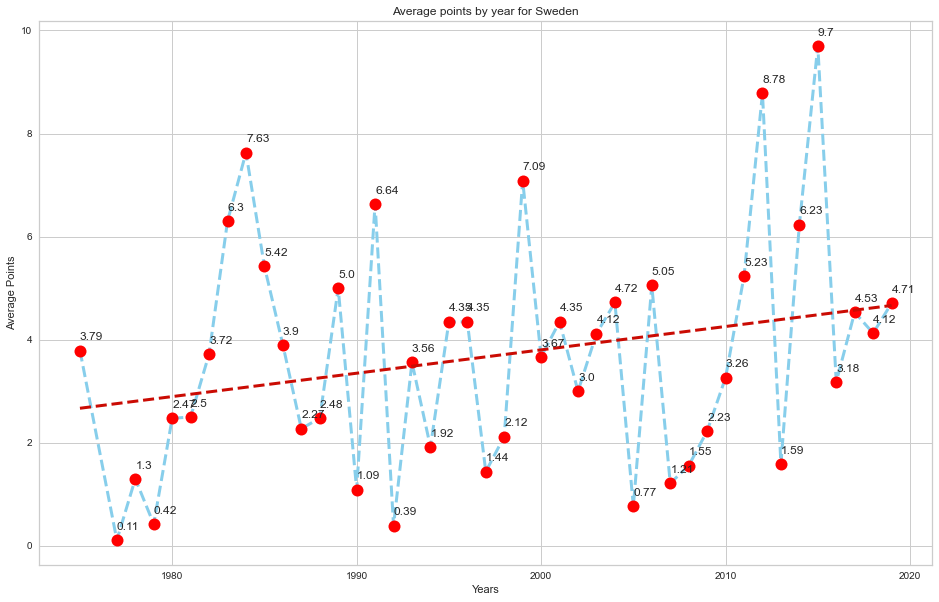

In [245]:
# average points per country by year
country = 'Sweden'

w = widgets.Dropdown(
    options=(['To country', 'Year']),
    description = 'Country:',
)

display(w)

df_average_points_per_country_by_year = df.groupby(['To country', 'Year']).agg({'Points': ['mean']})
x = df_average_points_per_country_by_year.loc[[country]].index.get_level_values('Year')
y = df_average_points_per_country_by_year.loc[[country]][('Points', 'mean')]
z = np.poly1d(np.polyfit(x, y, 1))(x)

mpl_fig=plt.figure(figsize=(16,10))
plt.plot(x, y, color='skyblue', linestyle='dashed', linewidth = 3, marker='o', markerfacecolor='red', markersize=12)
plt.plot(x, z,"r--", linewidth = 3)
for year, average_points in zip(x, y): 
    plt.text(year, average_points+0.2, str(round(average_points, 2)))
plt.xlabel('Years')
plt.ylabel('Average Points')
plt.title('Average points by year for ' + country)
plt.show()

In [249]:
from plotly.tools import mpl_to_plotly
from matplotlib import pyplot as plt
import dash
import dash_html_components as html
import dash_core_components as dcc

app= dash.Dash()

#fig= plt.figure()
#ax= fig.add_subplot(111)
#ax.plot(range(10), [i**2 for i in range(10)])
#ax.grid(True)

mpl_fig=plt.figure(figsize=(16,10))
plt.plot(x, y, color='skyblue', linestyle='dashed', linewidth = 3, marker='o', markerfacecolor='red', markersize=12)
plt.plot(x, z,"r--", linewidth = 3)
for year, average_points in zip(x, y): 
    plt.text(year, average_points+0.2, str(round(average_points, 2)))
plt.xlabel('Years')
plt.ylabel('Average Points')
plt.title('Average points by year for ' + country)

plotly_fig = mpl_to_plotly(mpl_fig)
plotly_fig
#app.layout= html.Div([
#    dcc.Graph(id= 'matplotlib-graph', figure=plotly_fig)

#])

#app.run_server(debug=True, port=8010, host='localhost')

In [248]:
from dash import Dash, dcc, html, Input, Output
import plotly.express as px
import pycountry
from jupyter_dash import JupyterDash 
from dash.dependencies import Input, Output

app = JupyterDash(__name__)

app.layout = html.Div([
    html.H4('Analysis of Iris data using scatter matrix'),
    dcc.Dropdown(
        id="dropdown",
        options=['Country', 'Year', 'Means'],
        value=['To country', 'Year', ['Points', 'mean']],
        multi=True
    ),
    dcc.Graph(id="graph"),
])


@app.callback(
    Output("graph", "figure"), 
    Input("dropdown", "value"))
def update_bar_chart(dims):
    df = px.df_average_points_per_country_by_year() # replace with your own data source
    fig = px.scatter_matrix(
        df, dimensions=dims)
    return fig


app.run_server(debug=True)

OSError: Address 'http://127.0.0.1:8050' already in use.
    Try passing a different port to run_server.

In [99]:
#from chart_studio import plotly
#unique_url = plotly.plot_mpl(mpl_fig, filename="my first plotly plot")

In [100]:
df_average_points_per_country_by_year.head()

Points
                     mean
To country Year          
Albania    2004  3.791667
           2005  1.358974
           2006  1.526316
           2007  1.166667
           2008  1.876923

In [101]:
import plotly.graph_objects as go
import plotly.express as px
from ipywidgets import widgets

In [102]:
check=df_average_points_per_country_by_year

In [117]:
df_average_points_per_country_by_year

,To country,Year,Points
,,,mean
0,Albania,2004,3.791667
1,Albania,2005,1.358974
2,Albania,2006,1.526316
3,Albania,2007,1.166667
4,Albania,2008,1.876923
...,...,...,...
1269,Yugoslavia,1988,4.142857
1270,Yugoslavia,1989,6.227273
1271,Yugoslavia,1990,3.681818


In [115]:
fig = px.scatter(df_average_points_per_country_by_year, x=("Year", ''), y=('Points','mean'), trendline="ols")
fig.show()

ValueError: Could not convert value of 'x' ('x') into a numeric type. If 'x' contains stringified dates, please convert to a datetime column.

In [119]:
year = widgets.IntSlider(
    value=1.0,
    min=1975.0,
    max=2010.0,
    step=1.0,
    description='Year:',
    continuous_update=False
)

container = widgets.HBox(children=[year])

#textbox = widgets.Dropdown(
#    description='Country:   ',
#    value='DL',
#    options=df_average_points_per_country_by_year['To country'].unique().tolist()
#)


origin = widgets.Dropdown(
    options=list(check['To country', ''),('Year','')].unique()),
    value='Belgium',
    description='Country:',
)

x = check.loc[['To country']].index.get_level_values('Year')
y = check.loc[['To country']][('Points', 'mean')]
z = np.poly1d(np.polyfit(x, y, 1))(x)


# Assign an empty figure widget with two traces
trace1 = go.Histogram(x=x,y=y,mode='marker')
g = go.FigureWidget(data=[trace1],
                    layout=go.Layout(
                        title=dict(
                            text='check'
                        )
                    ))

KeyError: (('To country', ''), ('Year', ''))

## Visualization

In [250]:
df_avg_points_per_country=df.groupby('To country').agg({'Points': ['mean']}).sort_values(('Points', 'mean'), ascending = False)

In [251]:
df_avg_points_per_country.head()

,Points
,mean
To country,
SerbiaandMontenegro,5.972973
Russia,4.465889
North Macedonia,4.400000
Australia,4.170732
Sweden,4.041494


In [252]:
df_avg_points_per_country.reset_index(inplace=True)
df_avg_points_per_country.head()

,To country,Points
,,mean
0,SerbiaandMontenegro,5.972973
1,Russia,4.465889
2,North Macedonia,4.400000
3,Australia,4.170732
4,Sweden,4.041494


In [ ]:
#to From counry as well
#-> Most friendly country? or love MUSIC overall

In [253]:
from dash import Dash, dcc, html, Input, Output
from jupyter_dash import JupyterDash
import plotly.express as px

external_stylesheets = ['https://codepen.io/chriddyp/pen/bWLwgP.css']

app = JupyterDash(__name__, external_stylesheets=external_stylesheets)

# Create server variable with Flask server object for use with gunicorn
server = app.server

app.layout = html.Div([
    html.H4("Title"),
    html.P("Select Distribution:"),
    dcc.RadioItems(
        id='distribution',
        options=['box', 'violin', 'rug'],
        value='box', inline=True
    ),
    dcc.Graph(id="graph"),
])


@app.callback(
    Output("graph", "figure"), 
    Input("distribution", "value"))
def display_graph(distribution):
    df = px.data.tips() # replace with your own data source
    fig = px.histogram(
        df_avg_points_per_country, x="To country", y="mean",
        marginal=distribution, range_x=[-5, 60],
        hover_data=df.columns)
    return fig


app.run_server(debug=True)

OSError: Address 'http://127.0.0.1:8050' already in use.
    Try passing a different port to run_server.

In [254]:
fig = px.histogram(
        df_avg_points_per_country, x="To country", y="Points",
        hover_data=df_avg_points_per_country.columns)

ValueError: The truth value of a DataFrame is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

In [255]:
#Examples

def column(matrix, i):
    return [row[i] for row in matrix]
column(df_avg_points_per_country, 0)

['To country', 'Points']

In [256]:
import matplotlib.pyplot as plt

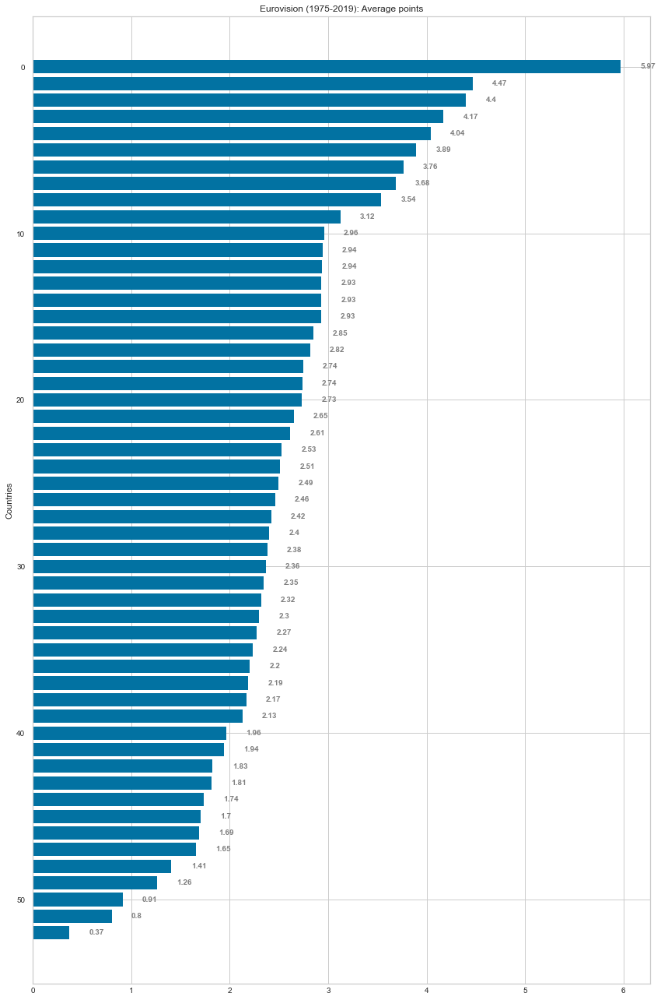

In [257]:
labels = df_avg_points_per_country[('Points', 'mean')].index
avg_points = list(df_avg_points_per_country[('Points', 'mean')])

fig, ax = plt.subplots(figsize=(12,18))
rects = ax.barh(labels, avg_points)

ax.invert_yaxis()

ax.set_ylabel('Countries')
ax.set_title('Eurovision (1975-2019): Average points')
ax.xaxis.set_tick_params(pad = 5)
ax.yaxis.set_tick_params(pad = 10)

for i in ax.patches:
    plt.text(i.get_width()+0.2, i.get_y()+0.5,
             str(round((i.get_width()), 2)),
             fontsize = 10, fontweight ='bold',
             color ='grey')

fig.tight_layout()

plt.show()

## Ranking

In [258]:
df_rank = df.groupby(['Edition', 'To country']).agg({'Points': ['sum']})
df_rank.columns = ['Total Points']

In [259]:
df_rank['Rank'] = df_rank.groupby(level=0).rank(ascending=False)
df_rank = df_rank.sort_values(['Edition','Rank'], ascending=[True, True])

In [260]:
df_rank.loc[['2019f']][:5]

#Data is wrong. Copy and paste from the github and check what's wrong

Total Points  Rank
Edition To country                         
2019f   The Netherlands           492   1.0
        Italy                     461   2.0
        Switzerland               356   3.0
        Russia                    353   4.0
        Norway                    334   5.0

In [261]:
df_rank.loc[['2019f']][-5:]

Total Points  Rank
Edition To country                       
2019f   Spain                    58  22.0
        Israel                   46  23.0
        Belarus                  38  24.0
        Germany                  32  25.0
        UnitedKingdom            14  26.0

In [262]:
# Let's remember that in 1991 France and Sweden got the same number of points, but Sweden won
df_rank.loc[('1991f', 'Sweden'), 'Rank'] = 1.0

In [263]:
n_winners_and_losers = 1
winners = df_rank.groupby(level=0).apply(lambda x: x.iloc[:n_winners_and_losers])
losers = df_rank.groupby(level=0).apply(lambda x: x.iloc[-n_winners_and_losers:])

df_winners_and_losers = pd.DataFrame({'Edition': winners.index.get_level_values(0)})
df_winners_and_losers.set_index('Edition', inplace=True)

df_winners_and_losers['Winning country'] = winners.index.get_level_values('To country')
df_winners_and_losers['Winning rank'] = list(winners['Rank'])
df_winners_and_losers['Winning points'] = list(winners['Total Points'])
df_winners_and_losers['Last place country'] = losers.index.get_level_values('To country')
df_winners_and_losers['Last place rank'] = list(losers['Rank'])
df_winners_and_losers['Last place points'] = list(losers['Total Points'])
df_winners_and_losers

,Winning country,Winning rank,Winning points,Last place country,Last place rank,Last place points
Edition,,,,,,
1975f,The Netherlands,1.0,152,Turkey,19.0,3
1976f,UnitedKingdom,1.0,164,Norway,18.0,7
1977f,France,1.0,136,Sweden,18.0,2
1978f,Israel,1.0,157,Norway,20.0,0
1979f,Israel,1.0,125,Belgium,18.5,5
...,...,...,...,...,...,...
2018sf1,Israel,1.0,283,Iceland,19.0,15
2018sf2,Norway,1.0,266,Georgia,18.0,24
2019f,The Netherlands,1.0,492,UnitedKingdom,26.0,14


In [134]:
winners

,,,Total Points,Rank
Edition,Edition,To country,,
1975f,1975f,The Netherlands,152,1.0
1976f,1976f,UnitedKingdom,164,1.0
1977f,1977f,France,136,1.0
1978f,1978f,Israel,157,1.0
1979f,1979f,Israel,125,1.0
...,...,...,...,...
2018sf1,2018sf1,Israel,283,1.0
2018sf2,2018sf2,Norway,266,1.0
2019f,2019f,The Netherlands,492,1.0


In [135]:
df_winners_and_losers.tail(10)

,Winning country,Winning rank,Winning points,Last place country,Last place rank,Last place points
Edition,,,,,,
2016sf2,Australia,1.0,330,Switzerland,18.0,28
2017f,Portugal,1.0,758,Spain,26.0,5
2017sf1,Portugal,1.0,370,Latvia,18.0,21
2017sf2,Bulgaria,1.0,403,SanMarino,18.0,1
2018f,Israel,1.0,529,Portugal,26.0,39
2018sf1,Israel,1.0,283,Iceland,19.0,15
2018sf2,Norway,1.0,266,Georgia,18.0,24
2019f,The Netherlands,1.0,492,UnitedKingdom,26.0,14
2019sf1,Australia,1.0,260,Finland,17.0,22


# ECONOMIC
<a name='economic'></a>

We have collected the following economical + cultural features of the participating countries:
- GDP per capita
- Industry proportion
- Political attitude
- Cultural goods export
- Youth population
- Language  

The sources of the data are as follows:
- [Eurostat Database](https://ec.europa.eu/eurostat/data/database)
- [Comparative Political Data Set](https://www.cpds-data.org/index.php)
- [Emergent 2021 Data 4 Good Challenge]()


Accordingly, we built the following hypotheses that could be answered during the analyses:
1. Richer (higher GDP) countries may gain higher points.
2. Industry distribution may have influence on the points that a country gained. 
3. The more culture goods a country export to other country, the higher points it will gain. Countries that have a lot of culture goods trades with other countries will gain higher point.
4. The countries have higher youth population increasing rate more tend to gain higher point.
5.  Certain Political attitude may be influential.
6.  Different language of a country have influence on the points that a country gained.


## Surpervised Machine Learning
<a name='supML'></a>

We are going to build supervised learning models with the ***Economic*** bucket.

The main library that will be used here is [***Pycaret***](https://pycaret.org/).

Data Manipulation

In [268]:
df = pd.read_csv('./mda_switzerland/mda_switzerland/bucket2_May22.csv')
df = df.loc[(df['year'] >= 2009)] #The data of youth_inrate is available from 2009

df_before_2016 = df.loc[(df['year'] < 2016)]
df_from_2016 = df.loc[(df['year'] >= 2016)]

'youth_inrate' is only available since 2009, and therefore we filter the data accordingly.  

In addition, the point system has changed since **2016**.  

Hence, we divide the data into two separate ones: Before 2016; From 2016

In [269]:
#BEFORE
df_reg_b = df_before_2016[['Points','language','gdp_per_capita','pillar_ind','politicalattitude','youth_inrate','culturegoodsexp_inrate']]
df_cat_b = df_before_2016[['points_grid','language','gdp_per_capita','pillar_ind','politicalattitude','youth_inrate','culturegoodsexp_inrate']]

#AFTER
df_reg_f = df_from_2016[['Points','language','gdp_per_capita','pillar_ind','politicalattitude','youth_inrate','culturegoodsexp_inrate']]
df_cat_f = df_from_2016[['points_grid','language','gdp_per_capita','pillar_ind','politicalattitude','youth_inrate','culturegoodsexp_inrate']]

Here we are going to use **Regression** and **Classification**

In [270]:
#df[['pillar_ind','politicalattitude']] = df[['pillar_ind','politicalattitude']].astype('category', copy=False)

#BEFORE
df_reg_b[['pillar_ind','politicalattitude']] = df[['pillar_ind','politicalattitude']].astype('category', copy=False)
df_cat_b[['points_grid','pillar_ind','politicalattitude']] = df[['points_grid','pillar_ind','politicalattitude']].astype('category', copy=False)

#AFTER
df_reg_f[['pillar_ind','politicalattitude']] = df[['pillar_ind','politicalattitude']].astype('category', copy=False)
df_cat_f[['points_grid','pillar_ind','politicalattitude']] = df[['points_grid','pillar_ind','politicalattitude']].astype('category', copy=False)

### Regression

We first build Regression models with "BEFORE 2016" data.

We draw 95% of the random samples to train the models.

In [271]:
data = df_reg_b.sample(frac=0.95, random_state=777)
data_unseen = df_reg_b.drop(data.index)

data.reset_index(inplace=True, drop=True)
data_unseen.reset_index(inplace=True, drop=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions ' + str(data_unseen.shape))

Data for Modeling: (383, 7)
Unseen Data For Predictions (20, 7)


In [272]:
from pycaret.regression import *
exp = setup(data = data,
                   target = 'Points',
                   session_id=123,
                   normalize = True, 
                   transformation = True, 
                   ignore_low_variance = True,
                   remove_multicollinearity = True,
                   multicollinearity_threshold = 0.95,
                   log_experiment = True)
                   #experiment_name = 'credit1')
                   #profile= True)

,Description,Value
0,session_id,123
1,Target,Points
2,Original Data,"(383, 7)"
3,Missing Values,True
4,Numeric Features,3
5,Categorical Features,3
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(268, 21)"


In [273]:
#we select top 2 models
top2 = compare_models(n_select = 2, fold = 5)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,40.7796,3014.3865,54.4558,0.1367,0.9259,1.3770,0.3000
rf,Random Forest Regressor,40.8178,3044.9153,54.8555,0.1176,0.9342,1.5134,0.0700
gbr,Gradient Boosting Regressor,41.0052,3216.9930,56.4042,0.0573,0.9589,1.4810,0.0200
par,Passive Aggressive Regressor,41.0769,3368.5080,57.3810,0.0516,0.9400,1.3933,0.0120
lasso,Lasso Regression,44.0981,3442.8255,58.1033,0.0294,1.0090,1.7334,0.8540
huber,Huber Regressor,41.6504,3444.7099,58.0582,0.0268,0.9407,1.3800,0.0140
lightgbm,Light Gradient Boosting Machine,43.7222,3401.0460,57.9375,0.0258,0.9699,1.5628,0.1820
ridge,Ridge Regression,43.3065,3416.2619,58.0376,0.0216,0.9914,1.6304,0.8140
lr,Linear Regression,43.3105,3446.1058,58.3664,0.0035,0.9864,1.5906,1.2780
br,Bayesian Ridge,45.0775,3547.1628,59.0349,-0.0039,1.0182,1.7363,0.0140


The **CATBOOST** algorithm appears to perform the best. We proceed with this algorithm for further analysis.

We create the model with 5-fold Cross Validation.

In [274]:
model = create_model('catboost', fold=5, round = 3)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,43.112,3332.441,57.727,0.269,0.759,0.806
1,40.585,2744.239,52.385,-0.017,0.979,1.052
2,31.258,1777.213,42.157,0.162,0.778,1.166
3,44.269,3259.794,57.095,0.263,0.927,1.170
4,44.674,3958.246,62.915,0.007,1.187,2.690
Mean,40.780,3014.387,54.456,0.137,0.926,1.377
Std,4.969,728.812,6.997,0.122,0.155,0.670


Next , we implement the Hyperparameter tuning. The optimizing parameter is set to be **MAE**.

We iteratively repeat this process until converging to an optimum. To do so, we set different iteration and check if the optimizer gets improved.

In [277]:
#tuned_model = tune_model(model, optimize = 'MAE', n_iter=3, fold=5) #MAE 42.2163 / R2=0.1058
#tuned_model = tune_model(model, optimize = 'MAE', n_iter=10, fold=5) #MAE 41.9018 / R2=0.1193 / 1.9s

#tuned_model = tune_model(model, optimize = 'MAE', n_iter=50, fold=5) #MAE 40.3068 / R2=0.1596 / 1.1m 
tuned_model = tune_model(model, optimize = 'MAE', n_iter=100, fold=5) #MAE 39.9368 / R2=0.1675 / 1.8m 

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,42.6591,3354.8553,57.9211,0.2636,0.7105,0.7550
1,39.5903,2602.4972,51.0147,0.0358,0.9934,1.2840
2,30.8250,1735.8289,41.6633,0.1816,0.7917,1.2274
3,43.6974,3033.8373,55.0803,0.3144,0.9304,1.1949
4,42.9123,3816.7754,61.7801,0.0421,1.1914,2.9644
Mean,39.9368,2908.7588,53.4919,0.1675,0.9235,1.4851
Std,4.7655,708.3363,6.8831,0.1132,0.1670,0.7632


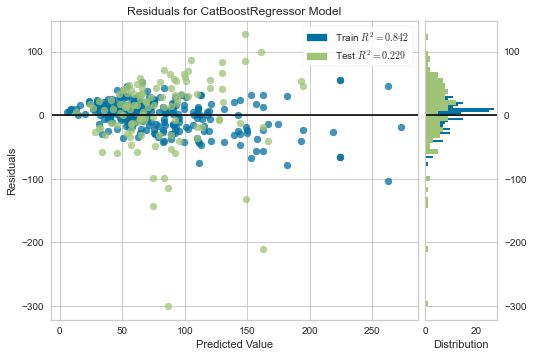

In [276]:
plot_model(tuned_model, plot = 'residuals') #n_iter=50, fold=5

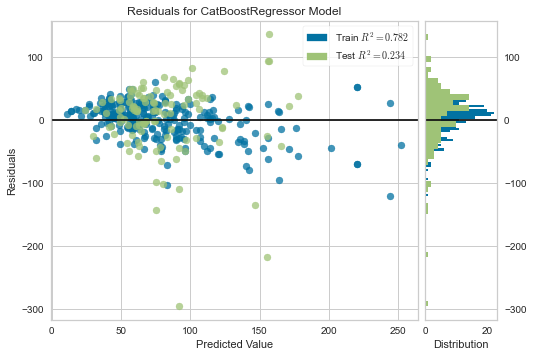

In [278]:
plot_model(tuned_model, plot = 'residuals') #n_iter=100, fold=5

Funnel shape is detected. The Markov assumptions are likely to be violated -> subject to overfitting.

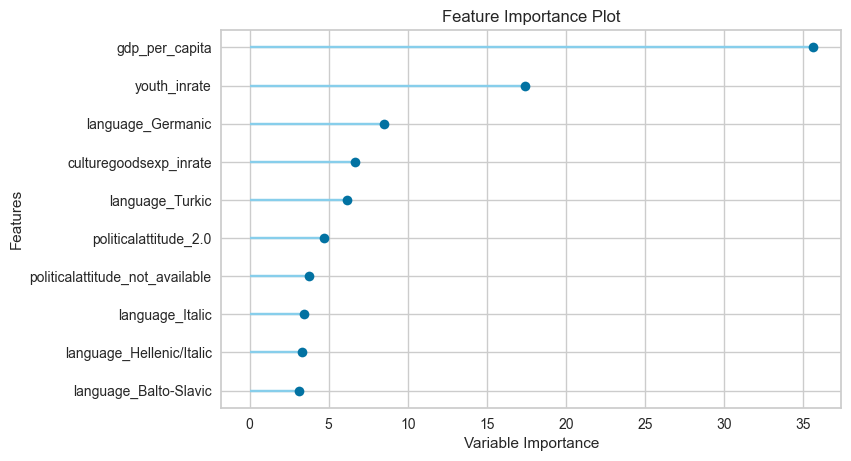

In [279]:
plot_model(tuned_model, plot = 'feature')

Interestingly, **GDP per capita & Youth_inrate** are indeed important variables in our model.

We can check the plots interactively with the function `evaluate_model()`

In [280]:
evaluate_model(tuned_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

We finalized the model (CatBoost algorithm), and now we predict the model with the validation set.

In conclusion, R-squared statistics is 30%, which is considered to be low.
Therefore, the selected variables are not sufficient to predict the Eurovision scores enough.

In other words, we assume that there would be more invisible factors that are highly associated to the scoring system as we have discovered in the EDA process (i.e. Countries tend to give higher scores to their neighboring countries.)

In [281]:
final_model = finalize_model(tuned_model)
print(final_model)

In [282]:
unseen_predictions = predict_model(final_model, data=data_unseen)
unseen_predictions.head()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,CatBoost Regressor,36.6570,3052.3784,55.2483,0.3088,0.7642,1.0321


,Points,language,gdp_per_capita,pillar_ind,politicalattitude,youth_inrate,culturegoodsexp_inrate,Label
0,18,Germanic,46286.0,3.0,1.0,NaN,NaN,63.922314
1,33,Hellenic/Italic,35518.0,3.0,2.0,0.018387,0.012614,85.015711
2,41,Afro-Asiatic,22528.0,3.0,1.0,NaN,NaN,60.127450
3,43,Afro-Asiatic,24922.0,3.0,2.0,NaN,NaN,86.534031
4,89,Italic,22499.0,3.0,2.0,NaN,NaN,54.269228


In [283]:
from pycaret.utils import check_metric
check_metric(unseen_predictions['Points'], unseen_predictions['Label'], metric = 'MAE')

36.657

We repeat the process for the **FROM 2016 data**.

In [284]:
data = df_reg_f.sample(frac=0.95, random_state=777)
data_unseen = df_reg_f.drop(data.index)

data.reset_index(inplace=True, drop=True)
data_unseen.reset_index(inplace=True, drop=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions ' + str(data_unseen.shape))

Data for Modeling: (224, 7)
Unseen Data For Predictions (12, 7)


In [285]:
from pycaret.regression import *
exp = setup(data = data,
                   target = 'Points',
                   session_id=123,
                   normalize = True, 
                   transformation = True, 
                   ignore_low_variance = True,
                   remove_multicollinearity = True,
                   multicollinearity_threshold = 0.95,
                   log_experiment = True)
                   #experiment_name = 'credit1')
                   #profile= True)

,Description,Value
0,session_id,123
1,Target,Points
2,Original Data,"(224, 7)"
3,Missing Values,True
4,Numeric Features,3
5,Categorical Features,3
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(156, 21)"


In [286]:
top2 = compare_models(n_select = 2, fold = 5)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lr,Linear Regression,86.5376,13546.6841,111.4185,-0.0531,0.8505,2.0644,0.0240
huber,Huber Regressor,84.8561,13985.4607,112.3665,-0.0652,0.8550,1.7217,0.0220
ridge,Ridge Regression,86.8789,13626.2140,112.0680,-0.0690,0.8423,2.0744,0.0140
llar,Lasso Least Angle Regression,87.1218,13569.7746,111.9779,-0.0720,0.8545,2.0441,0.0120
lasso,Lasso Regression,87.8794,13717.0936,112.6173,-0.0820,0.8548,2.1415,0.0120
dummy,Dummy Regressor,87.7927,13671.4127,112.6330,-0.0889,0.8565,2.0538,0.0100
br,Bayesian Ridge,87.7936,13671.9369,112.6352,-0.0890,0.8565,2.0538,0.0120
en,Elastic Net,88.7023,13909.0755,113.7165,-0.1102,0.8609,2.0727,0.8420
omp,Orthogonal Matching Pursuit,88.4704,13943.7265,113.7961,-0.1142,0.8646,2.0052,0.0120
lightgbm,Light Gradient Boosting Machine,88.3144,14837.0392,116.8669,-0.1614,0.8652,1.7081,0.1520


In [47]:
type(top2)
print(top2)

[LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=123, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0), DummyRegressor(constant=None, quantile=None, strategy='mean')]


In [287]:
#model = create_model('lightgbm', fold=5, round = 3)

model = create_model('lr', fold=5, round = 3)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,72.610,7614.954,87.264,0.069,1.090,6.412
1,108.393,18261.740,135.136,-0.268,0.991,1.613
2,110.446,27598.061,166.127,-0.154,0.678,0.515
3,72.091,7983.591,89.351,0.016,0.710,0.687
4,69.148,6275.075,79.215,0.071,0.784,1.095
Mean,86.538,13546.684,111.419,-0.053,0.851,2.064
Std,18.731,8230.221,33.654,0.135,0.162,2.207


In [302]:
#tuned_model = tune_model(model, optimize = 'MAE', n_iter=3, fold=5) #MAE 83.9226 / R2=-0.0307
#tuned_model = tune_model(model, optimize = 'MAE', n_iter=10, fold=5) #MAE 80.7957 / R2=0.0272
#tuned_model = tune_model(model, optimize = 'MAE', n_iter=50, fold=5) #MAE 80.7957 / R2=0.0272 / 1.2s
#tuned_model = tune_model(model, optimize = 'MAE', n_iter=100, fold=5) #MAE 80.7957 / R2=0.0272 / 2.1s
#tuned_model = tune_model(model, optimize = 'R2', n_iter=1000, fold=10) #R2 -0.11 
tuned_model = tune_model(model, optimize = 'R2', n_iter=1000, fold=20) #R2 -0.31

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,49.2397,3681.1156,60.6722,-0.2262,0.4931,0.5198
1,89.0692,9198.1857,95.9072,-0.4841,1.0452,1.9036
2,78.7007,8367.0438,91.4715,-0.1779,1.6722,21.6954
3,76.3385,8638.4783,92.9434,0.3287,0.7837,1.0395
4,72.4758,8389.7393,91.5955,-0.5655,0.7719,0.9065
5,125.8566,22360.9660,149.5358,-0.1005,1.1367,2.0729
6,142.7836,27720.4867,166.4947,-0.1229,1.1655,2.1421
7,56.2916,4308.1742,65.6367,0.2102,0.5268,0.6020
8,49.6578,3672.7397,60.6031,0.1910,0.4236,0.2961


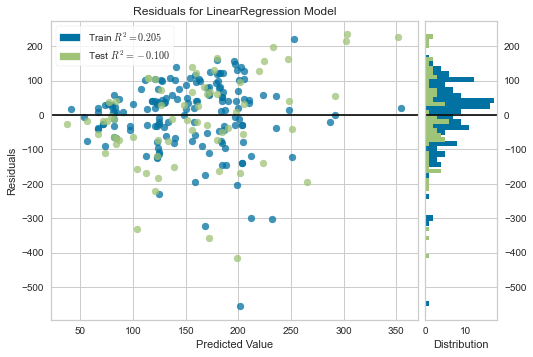

In [301]:
plot_model(tuned_model, plot = 'residuals') #n_iter=1000, fold=10

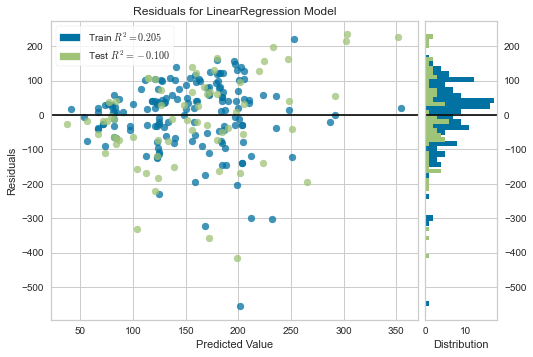

In [303]:
plot_model(tuned_model, plot = 'residuals') #n_iter=1000, fold=20

The more training the more funnel shape.

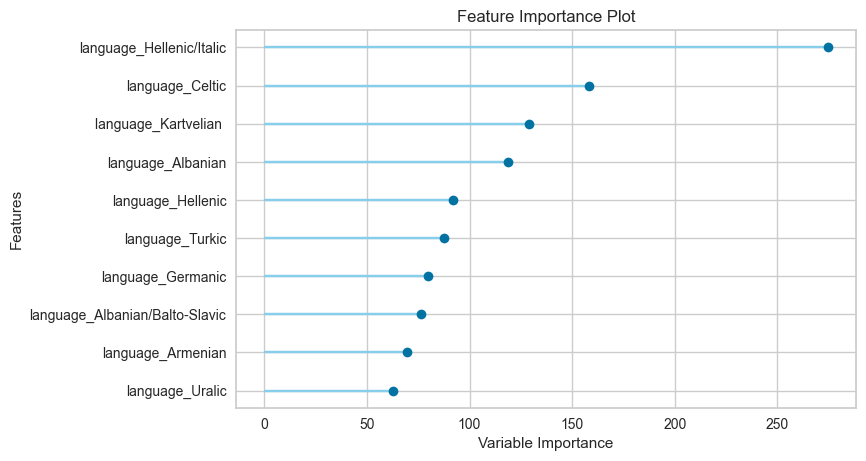

In [304]:
plot_model(tuned_model, plot = 'feature')

In [305]:
evaluate_model(tuned_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [306]:
final_model = finalize_model(tuned_model)
print(final_model)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=-1, normalize=False)


In [307]:
unseen_predictions = predict_model(final_model, data=data_unseen)
unseen_predictions.head()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Linear Regression,87.1967,9914.8615,99.5734,-0.2375,0.9953,1.6590


,Points,language,gdp_per_capita,pillar_ind,politicalattitude,youth_inrate,culturegoodsexp_inrate,Label
0,208,Germanic,75826.0,3.0,0.0,0.006155,NaN,185.146423
1,274,Germanic,54589.0,3.0,2.0,NaN,NaN,169.038818
2,170,Italic,45277.0,3.0,1.0,0.013459,0.011738,102.478447
3,183,Hellenic,19151.0,3.0,2.0,NaN,NaN,119.947723
4,51,Germanic,61988.0,3.0,0.0,NaN,NaN,194.526825


WHAT WE CAN DO IS LOG OF (POINTS) + GDP PER CAPITA

In [308]:
df_reg_f['logarithm_points'] = np.log10(df_reg_f['Points'])
df_reg_f['logarithm_gdppercapita'] = np.log10(df_reg_f['gdp_per_capita'])

In [309]:
df_reg_f = df_reg_f[['logarithm_points', 'logarithm_gdppercapita', 'language', 'pillar_ind', 'politicalattitude', 'youth_inrate', 'culturegoodsexp_inrate']]

In [310]:
data = df_reg_f.sample(frac=0.95, random_state=777)
data_unseen = df_reg_f.drop(data.index)

data.reset_index(inplace=True, drop=True)
data_unseen.reset_index(inplace=True, drop=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions ' + str(data_unseen.shape))

Data for Modeling: (224, 7)
Unseen Data For Predictions (12, 7)


In [311]:
from pycaret.regression import *
exp_clf102 = setup(data = data,
                   target = 'logarithm_points',
                   session_id=123,
                   normalize = True, 
                   transformation = True,
                   ignore_low_variance = True,
                   remove_multicollinearity = True,
                   multicollinearity_threshold = 0.95,
                   log_experiment = True)
                   #experiment_name = 'credit1')
                   #profile= True)

,Description,Value
0,session_id,123
1,Target,logarithm_points
2,Original Data,"(224, 7)"
3,Missing Values,True
4,Numeric Features,3
5,Categorical Features,3
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(156, 21)"


In [312]:
top2 = compare_models(n_select = 2, fold = 5)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.2723,0.1366,0.3622,-0.0921,0.1336,0.1366,0.1500
llar,Lasso Least Angle Regression,0.2841,0.1403,0.3679,-0.1286,0.1358,0.1414,0.0120
en,Elastic Net,0.2841,0.1403,0.3679,-0.1286,0.1358,0.1414,0.0140
dummy,Dummy Regressor,0.2841,0.1403,0.3679,-0.1286,0.1358,0.1414,0.0100
lasso,Lasso Regression,0.2841,0.1403,0.3679,-0.1286,0.1358,0.1414,0.0120
br,Bayesian Ridge,0.2843,0.1405,0.3681,-0.1297,0.1359,0.1415,0.0120
rf,Random Forest Regressor,0.2771,0.1431,0.3719,-0.1577,0.1375,0.1426,0.0700
huber,Huber Regressor,0.2851,0.1442,0.3745,-0.1725,0.1382,0.1431,0.0160
ada,AdaBoost Regressor,0.2871,0.1449,0.3746,-0.1752,0.1391,0.1438,0.0280
ridge,Ridge Regression,0.2881,0.1450,0.3757,-0.1831,0.1384,0.1429,0.0120


In [313]:
model = create_model('lightgbm', fold=5, round = 3)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.313,0.236,0.485,-0.070,0.224,0.145
1,0.328,0.151,0.389,-0.036,0.133,0.183
2,0.287,0.129,0.359,-0.484,0.112,0.125
3,0.220,0.073,0.271,0.074,0.089,0.106
4,0.214,0.094,0.307,0.056,0.110,0.125
Mean,0.272,0.137,0.362,-0.092,0.134,0.137
Std,0.047,0.056,0.074,0.203,0.047,0.026


In [314]:
tuned_model = tune_model(model, optimize = 'MAE', n_iter=1000, fold=5) #MAE 0.2660 / R2=-0.0068 / 20s

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.3022,0.2237,0.4729,-0.0160,0.2212,0.1378
1,0.3252,0.1472,0.3837,-0.0087,0.1311,0.1782
2,0.2818,0.1278,0.3575,-0.4686,0.1110,0.1219
3,0.2106,0.0755,0.2748,0.0457,0.0915,0.1016
4,0.2101,0.0869,0.2947,0.1276,0.1060,0.1216
Mean,0.2660,0.1322,0.3567,-0.0640,0.1322,0.1322
Std,0.0475,0.0527,0.0704,0.2087,0.0463,0.0257


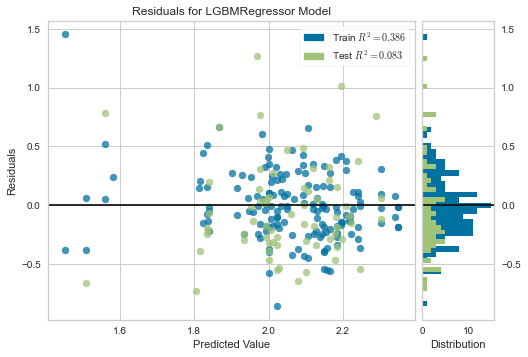

In [315]:
plot_model(tuned_model, plot = 'residuals') #n_iter=1000, fold=5

At least the residuals are plotted randomly!

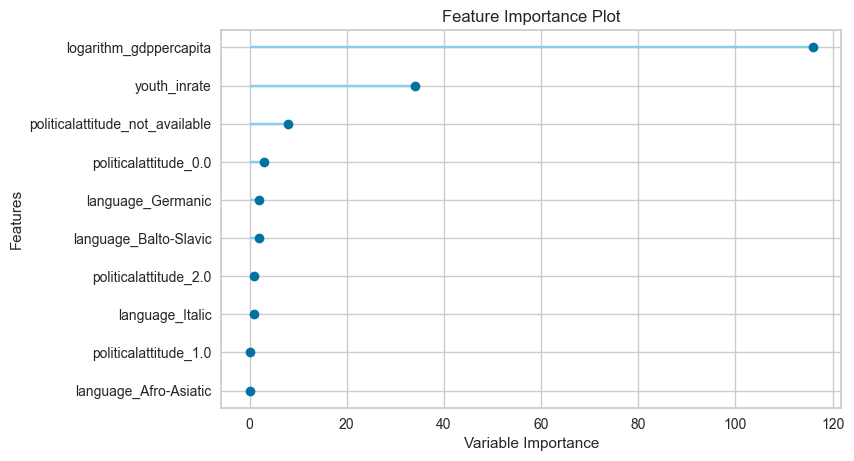

In [316]:
plot_model(tuned_model, plot = 'feature')

Again. 'youth_inrate' and **GDP per capita** seem to be more important than the rest.

In [317]:
evaluate_model(tuned_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [318]:
final_model = finalize_model(tuned_model)
print(final_model)

LGBMRegressor(bagging_fraction=1.0, bagging_freq=0, boosting_type='gbdt',
              class_weight=None, colsample_bytree=1.0, feature_fraction=0.8,
              importance_type='split', learning_rate=0.4, max_depth=-1,
              min_child_samples=16, min_child_weight=0.001, min_split_gain=0,
              n_estimators=260, n_jobs=-1, num_leaves=10, objective=None,
              random_state=123, reg_alpha=1, reg_lambda=0.15, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0)


In [319]:
unseen_predictions = predict_model(final_model, data=data_unseen)
unseen_predictions.head()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Light Gradient Boosting Machine,0.3200,0.1570,0.3963,-0.2037,0.1379,0.1853


,logarithm_points,logarithm_gdppercapita,language,pillar_ind,politicalattitude,youth_inrate,culturegoodsexp_inrate,Label
0,2.318063,4.879818,Germanic,3.0,0.0,0.006155,NaN,2.145020
1,2.437751,4.737105,Germanic,3.0,2.0,NaN,NaN,2.277085
2,2.230449,4.655878,Italic,3.0,1.0,0.013459,0.011738,2.166964
3,2.262451,4.282191,Hellenic,3.0,2.0,NaN,NaN,1.856182
4,1.707570,4.792308,Germanic,3.0,0.0,NaN,NaN,2.174222


### Classification

We have confirmed the log transformation of GDP per capita is indeed helpful to create better models.

We proceed with the log transformed GDP for classification models.

In [320]:
#df_reg_f['logarithm_points'] = np.log10(df_reg_f['Points'])
df_cat_b['logarithm_gdppercapita'] = np.log10(df_cat_b['gdp_per_capita'])
df_cat_b = df_cat_b[['points_grid', 'logarithm_gdppercapita', 'language', 'pillar_ind', 'politicalattitude', 'youth_inrate', 'culturegoodsexp_inrate']]

In [321]:
data = df_cat_b.sample(frac=0.95, random_state=777)
data_unseen = df_cat_b.drop(data.index)

data.reset_index(inplace=True, drop=True)
data_unseen.reset_index(inplace=True, drop=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions ' + str(data_unseen.shape))

Data for Modeling: (383, 7)
Unseen Data For Predictions (20, 7)


In [322]:
from pycaret.classification import *
exp_clf102 = setup(data = df_cat_b,
                   target = 'points_grid',
                   session_id=123,
                   normalize = True, 
                   transformation = True, 
                   ignore_low_variance = True,
                   remove_multicollinearity = True,
                   multicollinearity_threshold = 0.95,
                   log_experiment = True)
                   #experiment_name = 'credit1')
                   #profile= True)

,Description,Value
0,session_id,123
1,Target,points_grid
2,Target Type,Multiclass
3,Label Encoded,"0: 0, 1: 1, 2: 2, 3: 3"
4,Original Data,"(403, 7)"
5,Missing Values,True
6,Numeric Features,3
7,Categorical Features,3
8,Ordinal Features,False
9,High Cardinality Features,False


In [323]:
top2 = compare_models(n_select = 2, fold = 5)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.4294,0.6400,0.4327,0.4344,0.4296,0.2386,0.2394,0.0500
catboost,CatBoost Classifier,0.4044,0.6408,0.4106,0.4045,0.4012,0.2055,0.2066,0.8320
rf,Random Forest Classifier,0.3973,0.6379,0.4039,0.3921,0.3873,0.1962,0.1988,0.0920
et,Extra Trees Classifier,0.3973,0.6216,0.4037,0.3944,0.3894,0.1963,0.1984,0.0740
lr,Logistic Regression,0.3905,0.5762,0.3936,0.3913,0.3820,0.1886,0.1911,0.0080
gbc,Gradient Boosting Classifier,0.3904,0.6234,0.3975,0.3931,0.3877,0.1859,0.1872,0.0760
ridge,Ridge Classifier,0.3835,0.0000,0.3891,0.3863,0.3701,0.1811,0.1845,0.0060
xgboost,Extreme Gradient Boosting,0.3761,0.6294,0.3809,0.3801,0.3757,0.1665,0.1672,0.1320
lda,Linear Discriminant Analysis,0.3729,0.5839,0.3789,0.3751,0.3584,0.1668,0.1703,0.0080
dt,Decision Tree Classifier,0.3724,0.5823,0.3796,0.3740,0.3699,0.1626,0.1635,0.0080


In [324]:
model = create_model('lightgbm', fold=5, round = 3)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.368,0.559,0.373,0.365,0.364,0.158,0.159
1,0.386,0.620,0.389,0.383,0.383,0.181,0.181
2,0.411,0.651,0.412,0.402,0.406,0.214,0.214
3,0.518,0.697,0.519,0.540,0.524,0.356,0.358
4,0.464,0.673,0.471,0.482,0.472,0.284,0.285
Mean,0.429,0.640,0.433,0.434,0.430,0.239,0.239
Std,0.055,0.048,0.055,0.066,0.059,0.073,0.073


In [329]:
#tuned_model = tune_model(model, optimize = 'AUC', n_iter=3, fold=5) #
#tuned_model = tune_model(model, optimize = 'AUC', n_iter=10, fold=5) #
#tuned_model = tune_model(model, optimize = 'AUC', n_iter=50, fold=5) #
#tuned_model = tune_model(model, optimize = 'AUC', n_iter=100, fold=5) #Accuracy = 0.3941 / AUC = 0.6440 / 5.5s
tuned_model = tune_model(model, optimize = 'AUC', n_iter=500, fold=5) #Accuracy = 0.3972 / AUC = 0.6538 / 30s

#tuned_model = tune_model(model, optimize = 'AUC', n_iter=5000, fold=5) #Accuracy = 0.4011 / AUC = 0.6640 / 5.3m

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.3684,0.5888,0.3755,0.3409,0.3462,0.1583,0.1611
1,0.4211,0.6676,0.4275,0.4280,0.4166,0.2278,0.2298
2,0.3929,0.6644,0.3928,0.4176,0.3955,0.1908,0.1936
3,0.4286,0.6747,0.4269,0.4346,0.4251,0.2352,0.2369
4,0.3750,0.6783,0.3802,0.3555,0.3628,0.1656,0.1665
Mean,0.3972,0.6548,0.4006,0.3953,0.3892,0.1956,0.1976
Std,0.0241,0.0333,0.0225,0.0391,0.0304,0.0314,0.0313


Plot a model

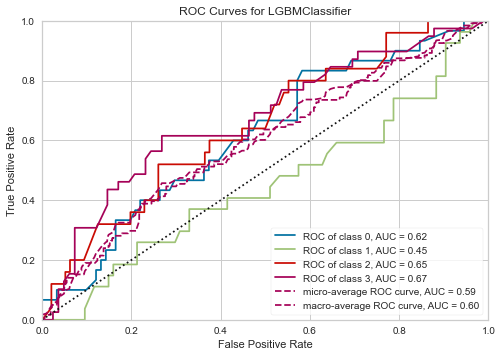

In [330]:
plot_model(tuned_model, plot = 'auc') #n_iter=500, fold =5

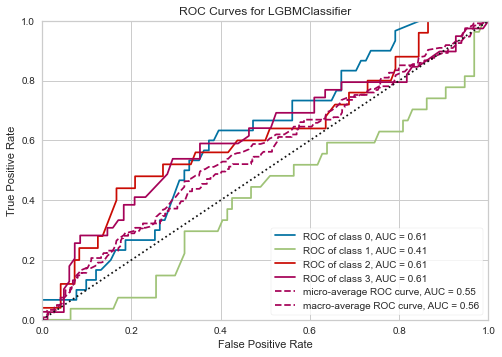

In [328]:
plot_model(tuned_model, plot = 'auc') #n_iter=5000, fold =5

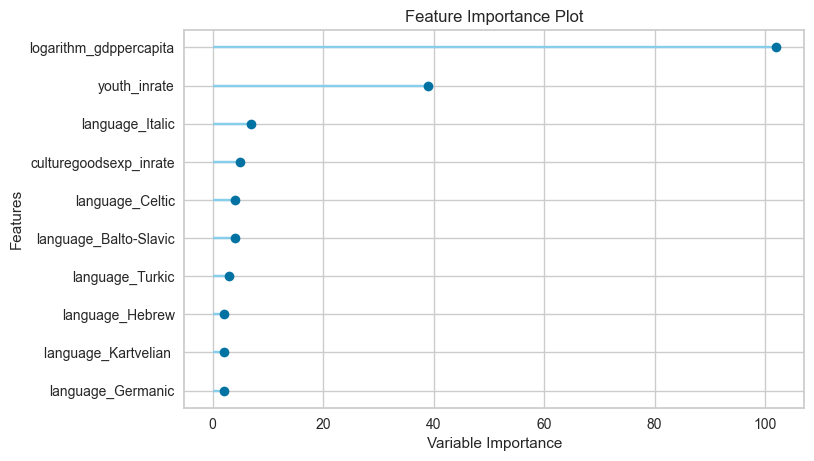

In [331]:
plot_model(tuned_model, plot = 'feature')

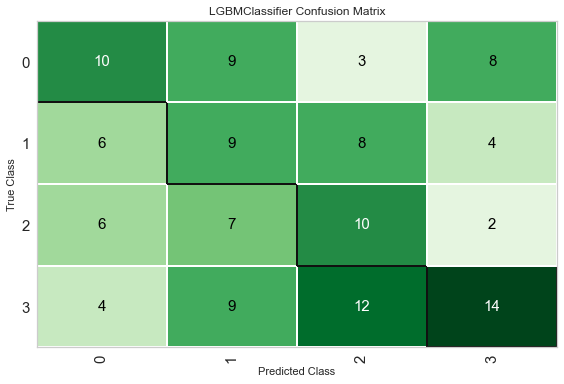

In [332]:
plot_model(tuned_model, plot = 'confusion_matrix')

In [333]:
evaluate_model(tuned_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

Finalize Model

In [334]:
final_model = finalize_model(tuned_model)
print(final_model)

LGBMClassifier(bagging_fraction=1.0, bagging_freq=1, boosting_type='gbdt',
               class_weight=None, colsample_bytree=1.0, feature_fraction=0.9,
               importance_type='split', learning_rate=0.3, max_depth=-1,
               min_child_samples=6, min_child_weight=0.001, min_split_gain=0.8,
               n_estimators=90, n_jobs=-1, num_leaves=80, objective=None,
               random_state=123, reg_alpha=0.005, reg_lambda=0.7, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)


In [335]:
unseen_predictions = predict_model(final_model, data=data_unseen)
unseen_predictions.head()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Light Gradient Boosting Machine,0.6000,0.9285,0.5917,0.6511,0.6003,0.4631,0.4812


,points_grid,logarithm_gdppercapita,language,pillar_ind,politicalattitude,youth_inrate,culturegoodsexp_inrate,Label,Score
0,0,4.665450,Germanic,3.0,1.0,NaN,NaN,2,0.3118
1,0,4.550449,Hellenic/Italic,3.0,2.0,0.018387,0.012614,0,0.4417
2,1,4.352723,Afro-Asiatic,3.0,1.0,NaN,NaN,1,0.3921
3,1,4.396583,Afro-Asiatic,3.0,2.0,NaN,NaN,3,0.2823
4,2,4.352163,Italic,3.0,2.0,NaN,NaN,1,0.3796


In [336]:
from pycaret.utils import check_metric
check_metric(unseen_predictions['points_grid'], unseen_predictions['Label'], metric = 'Accuracy')

0.6

FROM 2016

In [337]:
#df_reg_f['logarithm_points'] = np.log10(df_reg_f['Points'])
df_cat_f['logarithm_gdppercapita'] = np.log10(df_cat_f['gdp_per_capita'])
df_cat_f = df_cat_f[['points_grid', 'logarithm_gdppercapita', 'language', 'pillar_ind', 'politicalattitude', 'youth_inrate', 'culturegoodsexp_inrate']]

In [338]:
data = df_cat_f.sample(frac=0.95, random_state=777)
data_unseen = df_cat_f.drop(data.index)

data.reset_index(inplace=True, drop=True)
data_unseen.reset_index(inplace=True, drop=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions ' + str(data_unseen.shape))

Data for Modeling: (224, 7)
Unseen Data For Predictions (12, 7)


In [339]:
from pycaret.classification import *
exp_clf102 = setup(data = df_cat_f,
                   target = 'points_grid',
                   session_id=123,
                   normalize = True, 
                   transformation = True, 
                   ignore_low_variance = True,
                   remove_multicollinearity = True,
                   multicollinearity_threshold = 0.95,
                   log_experiment = True)
                   #experiment_name = 'credit1')
                   #profile= True)

,Description,Value
0,session_id,123
1,Target,points_grid
2,Target Type,Multiclass
3,Label Encoded,"0: 0, 1: 1, 2: 2, 3: 3"
4,Original Data,"(236, 7)"
5,Missing Values,True
6,Numeric Features,3
7,Categorical Features,3
8,Ordinal Features,False
9,High Cardinality Features,False


In [340]:
top2 = compare_models(n_select = 2, fold = 5)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.4061,0.6221,0.4048,0.4077,0.3955,0.2027,0.2072,0.0840
dt,Decision Tree Classifier,0.3939,0.6018,0.3900,0.3971,0.3860,0.1870,0.1916,0.0080
rf,Random Forest Classifier,0.3939,0.5866,0.3941,0.3947,0.3882,0.1872,0.1900,0.0840
gbc,Gradient Boosting Classifier,0.3879,0.5966,0.3795,0.3991,0.3805,0.1738,0.1771,0.0720
catboost,CatBoost Classifier,0.3879,0.5968,0.3810,0.3992,0.3823,0.1753,0.1798,0.5040
xgboost,Extreme Gradient Boosting,0.3515,0.5948,0.3412,0.3781,0.3444,0.1239,0.1279,0.1140
ada,Ada Boost Classifier,0.3273,0.5730,0.3135,0.3184,0.3089,0.0896,0.0884,0.0240
svm,SVM - Linear Kernel,0.2909,0.0000,0.3012,0.2599,0.2522,0.0554,0.0582,0.0140
nb,Naive Bayes,0.2848,0.5770,0.3098,0.3561,0.2207,0.0759,0.1043,0.0080
dummy,Dummy Classifier,0.2848,0.5000,0.2500,0.0814,0.1265,0.0000,0.0000,0.0060


In [341]:
#Extra Trees Classifiers

model = create_model('et', fold=5, round = 3)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.333,0.564,0.304,0.308,0.317,0.099,0.100
1,0.485,0.651,0.494,0.509,0.456,0.308,0.324
2,0.424,0.671,0.427,0.398,0.403,0.231,0.235
3,0.424,0.619,0.423,0.440,0.430,0.229,0.230
4,0.364,0.604,0.375,0.384,0.372,0.147,0.147
Mean,0.406,0.622,0.405,0.408,0.396,0.203,0.207
Std,0.053,0.037,0.063,0.066,0.048,0.073,0.077


In [344]:
tuned_model = tune_model(model, optimize = 'AUC', n_iter=50, fold=5) #Accuracy = 0.2909 / AUC = 0.5667 / 15.7s
#tuned_model = tune_model(model, optimize = 'AUC', n_iter=500, fold=5) #Accuracy = 0.3091 / AUC = 0.5883 / 2.2m

#tuned_model = tune_model(model, optimize = 'AUC', n_iter=2000, fold=5) 
#tuned_model = tune_model(model, optimize = 'AUC', n_iter=5000, fold=10) 


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.2424,0.5171,0.2170,0.2386,0.2404,-0.0148,-0.0148
1,0.3030,0.5848,0.3083,0.3068,0.2966,0.0744,0.0756
2,0.3636,0.6401,0.3562,0.3649,0.3607,0.1434,0.1443
3,0.2727,0.5745,0.2887,0.2367,0.2528,0.0318,0.0321
4,0.2727,0.5172,0.2842,0.2576,0.2621,0.0330,0.0333
Mean,0.2909,0.5667,0.2909,0.2809,0.2825,0.0536,0.0541
Std,0.0411,0.0462,0.0449,0.0490,0.0433,0.0530,0.0534


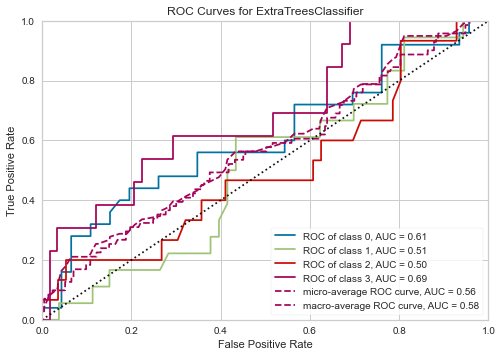

In [345]:
plot_model(tuned_model, plot = 'auc') #n_iter = 50, fold = 5

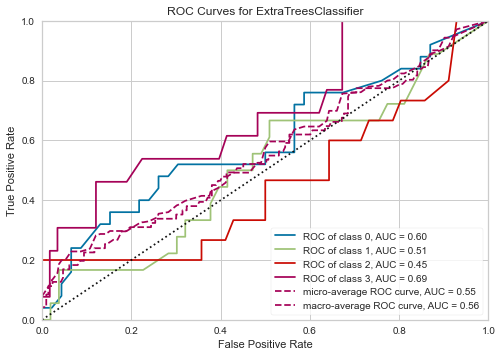

In [343]:
plot_model(tuned_model, plot = 'auc') #n_iter = 500, fold = 5

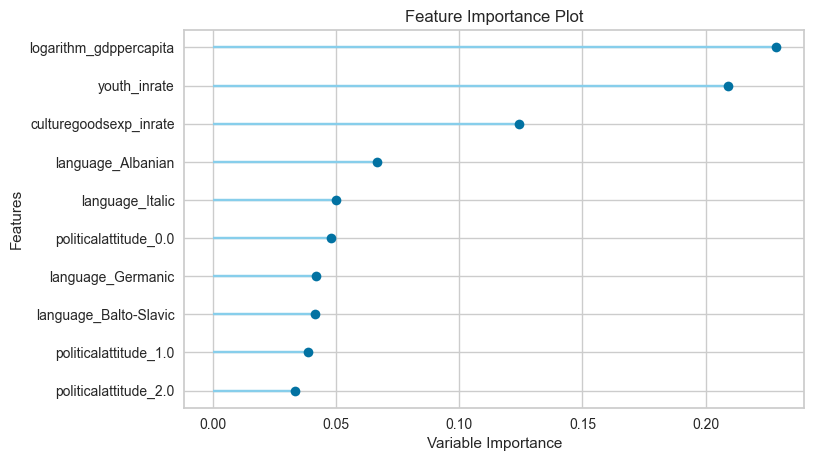

In [346]:
plot_model(tuned_model, plot = 'feature')

Compared to the **BEFORE 2016** model, the importance of **Youth_inrate and Culturegoodsexp_inrate** are indeed more important in this model.

This result is interesting.

In [347]:
evaluate_model(tuned_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [348]:
final_model = finalize_model(tuned_model)
print(final_model)

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                     class_weight='balanced_subsample', criterion='gini',
                     max_depth=9, max_features=1.0, max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0.0001,
                     min_impurity_split=None, min_samples_leaf=2,
                     min_samples_split=5, min_weight_fraction_leaf=0.0,
                     n_estimators=190, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False)


In [349]:
unseen_predictions = predict_model(final_model, data=data_unseen)
unseen_predictions.head()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Extra Trees Classifier,0.6667,0.9167,0.7500,0.6667,0.6476,0.5556,0.5661


,points_grid,logarithm_gdppercapita,language,pillar_ind,politicalattitude,youth_inrate,culturegoodsexp_inrate,Label,Score
0,2,4.879818,Germanic,3.0,0.0,0.006155,NaN,3,0.4390
1,3,4.737105,Germanic,3.0,2.0,NaN,NaN,3,1.0000
2,2,4.655878,Italic,3.0,1.0,0.013459,0.011738,2,1.0000
3,2,4.282191,Hellenic,3.0,2.0,NaN,NaN,0,0.3230
4,0,4.792308,Germanic,3.0,0.0,NaN,NaN,2,0.4347


In [350]:
from pycaret.utils import check_metric
check_metric(unseen_predictions['points_grid'], unseen_predictions['Label'], metric = 'Accuracy')

0.6667

## Unsupervised Machine Learning
<a name='unsupML'></a>
The section covers one unsupervised ML methods: Clustering

### Clustering

In [351]:
data = df_reg_f.sample(frac=0.95, random_state=777)
data_unseen = df_reg_f.drop(data.index)

data.reset_index(inplace=True, drop=True)
data_unseen.reset_index(inplace=True, drop=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions ' + str(data_unseen.shape))

Data for Modeling: (224, 7)
Unseen Data For Predictions (12, 7)


In [352]:
from pycaret.clustering import *
exp_clf102 = setup(data = data,
                   session_id=123,
                   normalize = True, 
                   transformation = True, 
                   ignore_low_variance = True,
                   remove_multicollinearity = True,
                   multicollinearity_threshold = 0.95,
                   log_experiment = True)
                   #experiment_name = 'credit1')
                   #profile= True)

,Description,Value
0,session_id,123
1,Original Data,"(224, 7)"
2,Missing Values,True
3,Numeric Features,4
4,Categorical Features,3
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(224, 17)"
9,CPU Jobs,-1


2022/06/01 01:53:03 INFO mlflow.tracking.fluent: Experiment with name 'cluster-default-name' does not exist. Creating a new experiment.


In [353]:
kmeans = create_model('kmeans')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1965,44.5275,1.607,0,0,0


In [354]:
evaluate_model(kmeans)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Cluster PCA Plot (2d)', …

In [355]:
result = assign_model(kmeans)
result.head()

,logarithm_points,logarithm_gdppercapita,language,pillar_ind,politicalattitude,youth_inrate,culturegoodsexp_inrate,Cluster
0,1.832509,4.422327,Hellenic,3.0,0.0,0.007642,NaN,Cluster 1
1,1.924279,3.700963,Balto-Slavic,3.0,NaN,0.001845,NaN,Cluster 3
2,2.056905,4.779690,Germanic,3.0,2.0,0.002740,NaN,Cluster 1
3,2.346353,4.176033,Balto-Slavic,3.0,2.0,0.006851,NaN,Cluster 3
4,2.214844,4.422327,Hellenic,3.0,0.0,0.007642,NaN,Cluster 0


In [356]:
predictions = predict_model(kmeans, data = data_unseen)
predictions.head()

,logarithm_points,logarithm_gdppercapita,language,pillar_ind,politicalattitude,youth_inrate,culturegoodsexp_inrate,Cluster
0,2.318063,4.879818,Germanic,3.0,0.0,0.006155,NaN,Cluster 0
1,2.437751,4.737105,Germanic,3.0,2.0,NaN,NaN,Cluster 0
2,2.230449,4.655878,Italic,3.0,1.0,0.013459,0.011738,Cluster 0
3,2.262451,4.282191,Hellenic,3.0,2.0,NaN,NaN,Cluster 3
4,1.707570,4.792308,Germanic,3.0,0.0,NaN,NaN,Cluster 1


# SONGS
<a name='songs'></a>

In this bucket, we put an emphasis on the Eurovision songs themselves.

##  Visualization
<a name='viz'></a>

In [50]:
import pandas as pd
import plotly.express as px
import numpy as np

import pycountry
import dash
from dash import dcc
from dash import html
from jupyter_dash import JupyterDash 
from dash.dependencies import Input, Output

In [51]:
url = 'https://github.com/jadewillaert/mda/raw/main/Bucket4%20-%20Blad1%20(1).csv'
df = pd.read_csv(url)
print(df.columns.values)

['YEAR' 'WINNER' 'SONG' 'Artist' 'POINTS' 'Language' 'Sex'
 'Format (band or not)' 'Genre' 'Order act' 'Total acts finale' 'BPM'
 'Genre billboard' 'Percentage of points possible']


In [52]:
df=df.dropna()

In [53]:
df['Sex'] = df['Sex'].map({0: 'female', 1: 'male', 2: 'mixed'}) #work
df['Format (band or not)'] = df['Format (band or not)'].map({0: 'Solo', 1: 'Band'})

In [54]:
df['Order'] = np.where(df['Order act']/df['Total acts finale'] <=0.5, 'Before','After')

In [56]:
df['tempo']=np.where(df['BPM'] <= 83,'Slow','Moderatly')
df['tempo']=np.where(df['BPM'] >= 120,'Fast','Moderatly')

In [55]:
fig1 = px.scatter(df, x="YEAR", y="Percentage of points possible", color='Sex')
fig1.show()

In [57]:
fig2 = px.pie(df,names='WINNER')
fig2.show()

fig3 = px.pie(df,names='Sex')
fig3.show()

fig4 = px.pie(df,names='Format (band or not)')
fig4.show()

fig5 = px.pie(df,names='Language')
fig5.show()

In [58]:
app = JupyterDash(__name__)

#---------------------------------------------------------------
app.layout = html.Div([
    html.Div([
        html.Label(['Eurovision']),
        dcc.Dropdown(
            id='my_dropdown',
            options=[
                     {'label': 'Language of song', 'value': 'Language'},
                     {'label': 'Gender of winner', 'value': 'Sex'},
                     {'label': 'Country', 'value': 'WINNER'},
                {'label': 'Format of act', 'value': 'Format (band or not)'},
                {'label': 'Before or after median','value':'Order'},
                {'label':'Tempo of song', 'value':'tempo'}
            ],
            value='Language',
            multi=False,
            clearable=False,
            style={"width": "50%"}
        ),
    ]),

    html.Div([
        dcc.Graph(id='the_graph')
    ]),

])

#---------------------------------------------------------------
@app.callback(
    Output(component_id='the_graph', component_property='figure'),
    [Input(component_id='my_dropdown', component_property='value')]
)

def update_graph(my_dropdown):
    dff = df

    piechart=px.pie(
            data_frame=dff,
            names=my_dropdown,
            )

    return (piechart)

app.run_server(mode='inline')


In [59]:
countries = {}
for country in pycountry.countries:
    countries[country.name] = country.alpha_3
df['codes'] = [countries.get(country, 'Unknown code') for country in df['WINNER']]

In [60]:
df['freq'] = df.groupby('WINNER')['WINNER'].transform('count')

In [61]:
fig6 = px.choropleth(df, locations="codes",
                    color="freq",
                    hover_name= "WINNER", 
                    color_continuous_scale=px.colors.sequential.Plasma)
fig6.update_layout(
    title_text = 'Countries that have won eurovision',
    geo_scope='europe',
)
fig6.show()

## Supervised Prediction Model
<a name='supML_song'></a>

In this section, we analyze...

In [357]:
#Import necessary libraries
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, balanced_accuracy_score
from sklearn.linear_model import LogisticRegression

import pandas as pd
from imblearn.under_sampling import RandomUnderSampler
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.preprocessing import StandardScaler
from numpy import pi
import matplotlib.pyplot as plt
from imblearn.pipeline import Pipeline as imbPipeline
from imblearn.ensemble import BalancedRandomForestClassifier
from imblearn.ensemble import RUSBoostClassifier
from sklearn.pipeline import Pipeline
from sklearn.model_selection import RandomizedSearchCV,StratifiedKFold

In [24]:
#We first use the sklearn-based algorithms

In [365]:
url='https://github.com/jadewillaert/mda/raw/main/bucket4_Songs2018_2022%20-%20Blad1%20(2).csv'
data = pd.read_csv(url)
print(data.columns.values)

['Language' 'Artist' 'Song' 'Jury' 'Public' 'Total Points' 'Year'
 'Country' 'Draw' 'BPM' 'Key' 'Standing']


In [366]:
data.head()

,Language,Artist,Song,Jury,Public,Total Points,Year,Country,Draw,BPM,Key,Standing
0,English,Netta Barzilai,Toy,212,317,529,2018,israel,22,130,E b MINOR,1
1,English,Eleni Foureira,Fuego,183,253,436,2018,cyprus,25,101,B MINOR,2
2,English,Cesár Sampson,Nobody but you,271,71,342,2018,austria,5,85,B MINOR,3
3,English,Michael Schulte,You let me walk alone,204,136,340,2018,germany,11,75,B MAJOR,4
4,Italian,Ermal Meta & Fabrizio Moro,Non mi avete fatto niente,59,249,308,2018,italy,26,90,G b MAJOR,5



We first divide the ranks of the songs into three group

- Place: Top3, Top 10 and 'outside Top 10'.
- Tempo: 'Slow', 'Moderately' and 'Fast'.
- Order: 'Before half', 'After Half'

In [367]:
#classify places
def Place(x):
   if x<=3:
      return 'Top 3'
   elif x > 3 and x <= 10:
      return 'Top 10'
   elif x > 10:
      return 'outside top 10'

data['Target']=data['Standing'].apply(Place)

In [368]:
#classify BPM
def Tempo(x):
  if x <= 83:
    return 'slow'
  elif x > 83 and x <=120:
    return 'Moderatly'
  elif x > 120:
    return 'Fast'
data['Tempo']=data['BPM'].apply(Tempo)

In [369]:
#classify draw
def order(x):
  if x <= 13:
    return 'Before half'
  elif x > 12:
    return 'After Half'
data['Order']=data['Draw'].apply(order)

In [370]:
#my classification made this unbalanced!!
data['Target'].value_counts()

outside top 10    63
Top 10            28
Top 3             12
Name: Target, dtype: int64

In [371]:
#We create the following data matrix for the analysis later on
data_classification = data[["Target",'Country', "Language", "Draw", 'Key', 'Tempo', 'Order']]
data_regression = data[["Total Points", "Country", "Language", "Draw", 'Key', "Tempo", "Order"]]

scikit-learn

In [22]:
#dummy for selected collums
selected_cols = ['Country','Tempo','Key','Language','Order']
one_hot_columns = pd.get_dummies(data[selected_cols])
one_hot_columns.head()

,Country_albania,Country_armenia,Country_australia,Country_austria,Country_azerbaijan,Country_belarus,Country_belgium,Country_bulgaria,Country_cyprus,Country_czech republic,...,Language_Portugees,Language_Roemeens,Language_Russian and English,Language_Serbian,Language_Slovene,Language_Spanish,Language_Spanish and English,Language_Ukrainian,Order_After Half,Order_Before half
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,0
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


In [44]:
# Add the numerical and categorical variables
# none of the correlated columns had categorical variables, so we can do that
X = one_hot_columns
y = data['Target'].copy()
y_points = data['Total Points'].copy()

In [24]:
# Split features and target into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1, stratify=y)

In [34]:
#BalancedRandomForestClassifier
BRF=BalancedRandomForestClassifier()
BRF.fit(X_train, y_train)
print(BRF)

BRFexpected_y  = y_test
BRFpredicted_y = BRF.predict(X_test)

print("Test Bal_Acc:" ,balanced_accuracy_score(y_test, BRFpredicted_y))  

#tempo & draw: 37
#bpm& draw: 32
#bpm & order: 35
#tempo & order: 42

BalancedRandomForestClassifier()
Test Bal_Acc: 0.35912698412698413


In [35]:
from sklearn.naive_bayes import BernoulliNB
BNB = BernoulliNB()
BNB.fit(X_train, y_train)
BNBexpected_y  = y_test
BNBpredicted_y = BNB.predict(X_test)

print("Test Bal_Acc:" ,balanced_accuracy_score(y_test, BNBpredicted_y))  

#tempo & draw:0.33
#bpm  & draw 33
#bpm & draw: 33
#tempo & order: 33

Test Bal_Acc: 0.3333333333333333


In [36]:
DTC = DecisionTreeClassifier(random_state=0)
DTC.fit(X_train, y_train)
DTCexpected_y  = y_test
DTCpredicted_y = DTC.predict(X_test)

print("Test Bal_Acc:" ,balanced_accuracy_score(y_test, DTCpredicted_y))  
#tempo  & draw 0.36
#bpm & draw 42
#bpm & order= 31
#tempo & order: 34

Test Bal_Acc: 0.3452380952380952


In [37]:
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import ExtraTreeClassifier
extra_tree = ExtraTreeClassifier(random_state=0)
ET = BaggingClassifier(extra_tree, random_state=0).fit(X_train, y_train)

ET.fit(X_train, y_train)

ETexpected_y  = y_test
ETpredicted_y = ET.predict(X_test)

print("Test Bal_Acc:" ,balanced_accuracy_score(y_test, ETpredicted_y)) 

#tempo & draw 27
#bpm & draw 36
#bpm & order: 40
#tempo & order:45

Test Bal_Acc: 0.4503968253968254


In [38]:
from sklearn.neighbors import KNeighborsClassifier
neigh = KNeighborsClassifier(n_neighbors=3)
neigh.fit(X_train, y_train)

neighexpected_y  = y_test
neighpredicted_y = neigh.predict(X_test)

print("Test Bal_Acc:" ,balanced_accuracy_score(y_test, neighpredicted_y))  
#tempo & draw 39
#bpm & draw 30
#bpm & order: 36
#tempo & order:19

Test Bal_Acc: 0.25595238095238093


In [39]:
from sklearn.naive_bayes import GaussianNB
GNB = GaussianNB()

GNB.fit(X_train, y_train)

GNBexpected_y  = y_test
GNBpredicted_y = GNB.predict(X_test)

print("Test Bal_Acc:" ,balanced_accuracy_score(y_test, GNBpredicted_y))  
#tempo & draw 44
#bpm & draw 44
#bpm & order: 44
#tempo & order:44

Test Bal_Acc: 0.44246031746031744


In [40]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
LDA = LinearDiscriminantAnalysis()

LDA.fit(X_train, y_train)

LDAexpected_y  = y_test
LDApredicted_y = LDA.predict(X_test)

print("Test Bal_Acc:" ,balanced_accuracy_score(y_test, LDApredicted_y))  
#tempo & draw 46
#bpm & draw 42
#bpm & order: 42
#tempo & order:35

Test Bal_Acc: 0.3521825396825397


In [41]:
from sklearn.linear_model import LogisticRegression
LR = LogisticRegression(random_state=0, max_iter=400, multi_class='multinomial').fit(X_train, y_train)

LRexpected_y  = y_test
LRpredicted_y = LR.predict(X_test)

print("Test Bal_Acc:" ,balanced_accuracy_score(y_test, LRpredicted_y))  

#tempo & draw 38
#bpm & draw 49
#bpm & order: 36
#tempo & order:33

Test Bal_Acc: 0.33928571428571425


In [42]:
from sklearn.neural_network import MLPClassifier

MLP = MLPClassifier(random_state=1, max_iter=300).fit(X_train, y_train)

MLPexpected_y  = y_test
MLPpredicted_y = LR.predict(X_test)

print("Test Bal_Acc:" ,balanced_accuracy_score(y_test, MLPpredicted_y))  
#tempo & draw 38
#bpm 49
#bpm & order 36
#tempo & order:33

Test Bal_Acc: 0.33928571428571425


C:\Users\gunho\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


In [43]:
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis

QDA = QuadraticDiscriminantAnalysis()

QDA.fit(X_train, y_train)

QDAexpected_y  = y_test
QDApredicted_y = QDA.predict(X_test)

print("Test Bal_Acc:" ,balanced_accuracy_score(y_test, QDApredicted_y))  
#tempo & draw 19
#bpm & draw 39
#bpm & order 30
#tempo & order:49

Test Bal_Acc: 0.45138888888888884


C:\Users\gunho\anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


In [44]:
from sklearn.linear_model import RidgeClassifier
RC=RidgeClassifier()
RC.fit(X_train, y_train)

RCexpected_y  = y_test
RCpredicted_y = RC.predict(X_test)

print("Test Bal_Acc:" ,balanced_accuracy_score(y_test, RCpredicted_y))  

#tempo & draw 47
#bpm & draw31
#bpm & order 31
#tempo & order:47

Test Bal_Acc: 0.4771825396825397


In [45]:
from sklearn.linear_model import RidgeClassifierCV

RCCV = RidgeClassifierCV(alphas=[1e-3, 1e-2, 1e-1, 1]).fit(X_train, y_train)

RCCVexpected_y  = y_test
RCCVpredicted_y = RCCV.predict(X_test)

print("Test Bal_Acc:" ,balanced_accuracy_score(y_test, RCCVpredicted_y))  
#tempo & draw 47
#bpm & draw 31
#bpm & order 31
#tempo & order:47

Test Bal_Acc: 0.4771825396825397


pycaret

In [71]:
X=X.applymap(int) # WORKS!

In [72]:
#PYCARET
data_class = pd.concat([X,y], axis=1)
data_reg = pd.concat([X,y_points], axis=1)

In [73]:
data_reg.dtypes

Country_albania                 int64
Country_armenia                 int64
Country_australia               int64
Country_austria                 int64
Country_azerbaijan              int64
                                ...  
Language_Spanish and English    int64
Language_Ukrainian              int64
Order_After Half                int64
Order_Before half               int64
Total Points                    int64
Length: 98, dtype: object

In [43]:
from pycaret.classification import *
exp_clf102 = setup(data = pycaret_data,
                   target = 'Target',
                   session_id=123,
                   normalize = True, 
                   transformation = True, 
                   ignore_low_variance = True,
                   remove_multicollinearity = True,
                   multicollinearity_threshold = 0.95,
                   #categorical_features = ['Tempo', 'Order', 'Country', 'Key'],
                   log_experiment = True)
                   #experiment_name = 'credit1',
                   #profile= True)

IntProgress(value=0, description='Processing: ', max=3)

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,12:44:22
Status,. . . . . . . . . . . . . . . . . .,Creating Logs
Estimator,. . . . . . . . . . . . . . . . . .,Stacking Regressor


Text(value="Following data types have been inferred automatically, if they are correct press enter to continue…

,Data Type
Country_albania,Categorical
Country_armenia,Categorical
Country_australia,Categorical
Country_austria,Categorical
Country_azerbaijan,Categorical
...,...
Language_Spanish and English,Categorical
Language_Ukrainian,Categorical
Order_After Half,Categorical
Order_Before half,Categorical


quit


SystemExit: Read the documentation of setup to learn how to overwrite data types over the inferred types. setup function must run again before you continue modeling.

In [30]:
top2 = compare_models(n_select = 2, fold = 5)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.6686,0.3526,0.3333,0.4501,0.5371,0.0000,0.0000,0.1480
dummy,Dummy Classifier,0.6686,0.5000,0.3333,0.4501,0.5371,0.0000,0.0000,0.0040
lr,Logistic Regression,0.6552,0.4088,0.3352,0.4883,0.5546,0.0377,0.0505,0.0400
knn,K Neighbors Classifier,0.6267,0.5352,0.3126,0.4790,0.5425,0.0363,0.0461,0.7140
svm,SVM - Linear Kernel,0.6257,0.0000,0.3630,0.5595,0.5727,0.1076,0.1359,0.7860
ridge,Ridge Classifier,0.6257,0.0000,0.3319,0.5142,0.5592,0.0545,0.0616,0.0080
qda,Quadratic Discriminant Analysis,0.6019,0.0000,0.3333,0.3923,0.4696,0.0000,0.0000,0.0060
catboost,CatBoost Classifier,0.5962,0.6025,0.3285,0.5333,0.5443,0.0277,0.0495,0.8800
rf,Random Forest Classifier,0.5848,0.5682,0.3104,0.4907,0.5283,-0.0232,-0.0267,0.0860
dt,Decision Tree Classifier,0.5429,0.6182,0.2989,0.4903,0.5125,-0.0170,-0.0178,0.7460


In [31]:
model = create_model('dt', fold=5, round = 3)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.467,0.571,0.306,0.413,0.438,-0.043,-0.045
1,0.533,0.700,0.389,0.526,0.520,0.160,0.170
2,0.643,0.602,0.300,0.536,0.584,0.054,0.062
3,0.571,0.641,0.267,0.476,0.519,-0.167,-0.183
4,0.500,0.578,0.233,0.500,0.500,-0.089,-0.093
Mean,0.543,0.618,0.299,0.490,0.513,-0.017,-0.018
Std,0.061,0.048,0.052,0.044,0.047,0.114,0.123


In [34]:
#hyperparameter tuning
#tuned_model = tune_model(model, optimize = 'AUC', n_iter=100, fold=5) 
#tuned_model = tune_model(model, optimize = 'AUC', n_iter=300, fold=5) #2sec
tuned_model = tune_model(model, optimize = 'AUC', n_iter=1000, fold=5) #5sec

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6000,0.5481,0.3796,0.5026,0.5253,0.1000,0.1245
1,0.6000,0.5091,0.3333,0.4154,0.4909,0.1000,0.1245
2,0.7143,0.6223,0.3333,0.5495,0.6211,0.1385,0.1903
3,0.7143,0.5000,0.3333,0.5102,0.5952,0.0000,0.0000
4,0.7143,0.6223,0.3333,0.5495,0.6211,0.1385,0.1903
Mean,0.6686,0.5603,0.3426,0.5054,0.5707,0.0954,0.1259
Std,0.0560,0.0531,0.0185,0.0490,0.0531,0.0507,0.0695


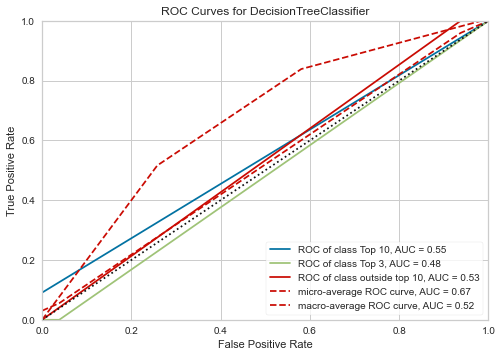

In [36]:
plot_model(tuned_model, plot = 'auc') #n_iter=50 fold=5

In [37]:
evaluate_model(tuned_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

Regression

In [38]:
data_regression.head()

,Total Points,Country,Language,Draw,Key,Tempo,Order,log Total Points
0,529,israel,English,22,E b MINOR,Fast,After Half,2.723456
1,436,cyprus,English,25,B MINOR,Moderatly,After Half,2.639486
2,342,austria,English,5,B MINOR,Moderatly,Before half,2.534026
3,340,germany,English,11,B MAJOR,slow,Before half,2.531479
4,308,italy,Italian,26,G b MAJOR,Moderatly,After Half,2.488551


In [13]:
data_regression_log = data_regression

In [40]:
#data_regression_log['log Total Points'] = np.log10(data_regression_log['Total Points'])
data_regression_log = data_regression_log[["log Total Points", 'Country', 'Language', 'Draw', 'Tempo', 'Order']]

In [74]:
from pycaret.regression import *
exp_clf102 = setup(data = data_reg,
                   target = 'Total Points',
                   session_id=123,
                   normalize = True, 
                   transformation = True, 
                   ignore_low_variance = True,
                   remove_multicollinearity = True,
                   multicollinearity_threshold = 0.95,
                   #categorical_features = ['Tempo', 'Order', 'Country', 'Key'],
                   log_experiment = True)
                   #experiment_name = 'credit1',
                   #profile= True)

,Description,Value
0,session_id,123
1,Target,Total Points
2,Original Data,"(103, 98)"
3,Missing Values,False
4,Numeric Features,0
5,Categorical Features,97
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(72, 15)"


In [76]:
top3 = compare_models(n_select = 3, fold = 5)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
omp,Orthogonal Matching Pursuit,109.4322,19074.1121,133.1157,-0.0075,1.1860,2.6101,0.0060
lightgbm,Light Gradient Boosting Machine,118.2850,21675.9994,143.7752,-0.1715,1.2354,2.8351,0.1420
en,Elastic Net,117.2971,21441.3160,143.2085,-0.1795,1.2337,2.8776,0.0080
dummy,Dummy Regressor,117.2452,21505.3222,143.6902,-0.1947,1.2349,2.8704,0.0060
par,Passive Aggressive Regressor,112.5864,24370.6957,149.7416,-0.1980,1.1992,2.0008,0.0060
br,Bayesian Ridge,117.4156,21661.4206,144.1306,-0.2000,1.2367,2.8705,0.0080
knn,K Neighbors Regressor,118.6442,23091.8160,149.5639,-0.4081,1.2464,2.5915,0.0100
ridge,Ridge Regression,126.6211,24470.2420,153.1743,-0.4706,1.2683,2.9879,0.0100
ada,AdaBoost Regressor,125.5846,22966.8577,150.3112,-0.4750,1.2502,2.8992,0.0120
llar,Lasso Least Angle Regression,124.3936,23276.2507,149.3924,-0.5109,1.2312,2.8188,0.0080


In [77]:
tuned_top3 = [tune_model(i) for i in top3]

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,98.1757,11971.5538,109.4146,-0.3972,2.0745,2.0218
1,86.3261,13593.0766,116.5894,-0.0331,0.7398,0.9007
2,149.2015,37022.0839,192.4112,-0.2878,1.5451,7.8589
3,136.2302,19625.8364,140.0922,-0.2525,1.9594,8.8209
4,55.0022,4416.8056,66.4591,-0.2082,0.5158,0.5619
5,126.5715,22675.9173,150.5852,-0.0819,0.6933,0.7020
6,127.0805,26811.6261,163.7426,0.0166,1.4683,4.9113
7,138.9247,27691.0847,166.4064,-0.1494,0.8968,1.0846
8,172.5834,43909.9643,209.5470,0.0002,1.3077,2.5500


In [78]:
blender = blend_models(tuned_top3)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,104.5636,12666.3684,112.5450,-0.4782,2.0631,2.0127
1,82.6443,13338.7748,115.4936,-0.0138,0.7199,0.8398
2,150.9456,38139.3238,195.2929,-0.3266,1.5552,7.9192
3,138.4739,20623.7684,143.6098,-0.3162,1.9729,8.9483
4,53.6611,4071.1678,63.8057,-0.1137,0.4950,0.5304
5,116.4966,18138.2134,134.6782,0.1346,0.6297,0.6523
6,106.3257,19565.9222,139.8782,0.2824,1.4159,4.7092
7,137.5485,28538.6292,168.9338,-0.1846,0.8951,1.0251
8,169.3321,43929.6121,209.5939,-0.0002,1.2845,2.4177


In [79]:
stacker = stack_models(tuned_top3)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,170.2813,35733.5022,189.0331,-3.1703,2.2512,3.0864
1,164.2382,41840.5867,204.5497,-2.1800,1.2235,2.0014
2,146.8454,51825.5235,227.6522,-0.8027,1.7293,7.5916
3,118.8137,22281.6199,149.2703,-0.4220,2.0374,10.6232
4,65.5593,6531.4466,80.8174,-0.7867,0.5890,0.6430
5,126.0117,22623.2260,150.4102,-0.0794,0.9093,0.6722
6,94.0499,10892.2803,104.3661,0.6005,1.3770,3.9755
7,208.1752,51216.7798,226.3112,-1.1260,1.1591,1.5068
8,186.8341,57337.6579,239.4528,-0.3055,1.6514,2.4312


In [80]:
best_mae_model = automl(optimize = 'MAE')

In [81]:
evaluate_model(best_mae_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

Outliers?

In [82]:
final_model = finalize_model(best_mae_model)
print(final_model)

OrthogonalMatchingPursuit(fit_intercept=True, n_nonzero_coefs=None,
                          normalize=True, precompute='auto', tol=None)


In [86]:
unseen_predictions = predict_model(final_model, data=data_unseen)
unseen_predictions.head()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Light Gradient Boosting Machine,0.4833,0.4370,0.6611,0.1033,0.3234,0.1522


,logarithm_points,logarithm_gdppercapita,language,pillar_ind,politicalattitude,youth_inrate,culturegoodsexp_inrate,Label
0,2.396199,3.555336,Armenian,4.0,NaN,-0.003993,NaN,2.066635
1,2.559907,4.644330,Germanic,4.0,1.0,0.003590,-0.072,2.120735
2,2.879669,4.331164,Italic,4.0,3.0,NaN,NaN,1.952841
3,1.778151,4.857393,Germanic,4.0,1.0,NaN,NaN,2.126528
4,1.919078,3.760573,Balto-Slavic,4.0,NaN,0.000667,NaN,1.984316


CLASSIFICATION

In [14]:
from pycaret.classification import *
exp_clf102 = setup(data = data_classification,
                   target = 'Target',
                   session_id=123,
                   normalize = True, 
                   transformation = True, 
                   ignore_low_variance = True,
                   remove_multicollinearity = True,
                   multicollinearity_threshold = 0.95,
                   #categorical_features = ['Tempo', 'Order', 'Country', 'Key'],
                   log_experiment = True,
                   experiment_name = 'credit1',
                   profile= True)

In [15]:
top3 = compare_models(n_select = 3, fold = 5)

#20% of the data is used for testing. Considered pretty accurate

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
dummy,Dummy Classifier,0.6686,0.5000,0.3333,0.4501,0.5371,0.0000,0.0000,0.0060
rf,Random Forest Classifier,0.6400,0.4843,0.3293,0.4724,0.5377,-0.0244,-0.0343,0.0820
lightgbm,Light Gradient Boosting Machine,0.6400,0.4679,0.3200,0.4433,0.5220,-0.0270,-0.0311,0.2060
lr,Logistic Regression,0.6390,0.3706,0.3300,0.5184,0.5531,0.0217,0.0446,0.7340
et,Extra Trees Classifier,0.6124,0.4517,0.3152,0.4919,0.5435,0.0212,0.0216,0.0820
catboost,CatBoost Classifier,0.5981,0.4609,0.3085,0.4630,0.5199,-0.0463,-0.0552,0.5720
ada,Ada Boost Classifier,0.5971,0.5467,0.3156,0.4874,0.5162,0.0428,0.0570,0.0280
xgboost,Extreme Gradient Boosting,0.5705,0.5521,0.3037,0.4859,0.5226,-0.0374,-0.0474,0.1440
svm,SVM - Linear Kernel,0.5686,0.0000,0.3052,0.4916,0.5222,-0.0449,-0.0449,0.0100
ridge,Ridge Classifier,0.5562,0.0000,0.2878,0.4619,0.5024,-0.0835,-0.0941,0.0160


In [29]:
#lr = create_model('lr', fold=5, round = 3)
#lightgbm = create_model('lightgbm', fold=5, round=3)

#model = create_model('rf', fold=5, round=3)

model = create_model('xgboost', fold=5, round=3)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.533,0.718,0.343,0.448,0.487,0.045,0.048
1,0.533,0.598,0.343,0.439,0.476,0.000,0.000
2,0.571,0.585,0.267,0.571,0.571,0.045,0.046
3,0.643,0.606,0.300,0.495,0.559,-0.111,-0.148
4,0.571,0.255,0.267,0.476,0.519,-0.167,-0.183
Mean,0.570,0.552,0.304,0.486,0.523,-0.037,-0.047
Std,0.040,0.156,0.034,0.047,0.038,0.086,0.099


In [31]:
#tuned_rf = tune_model(model, optimize = 'AUC', n_iter=10, fold=5) #2.1 sec
#tuned_rf = tune_model(model, optimize = 'AUC', n_iter=100, fold=5) #0.5971 acc, 0.5655 AUC, 22.2 sec
#tuned_rf = tune_model(model, optimize = 'AUC', n_iter=300, fold=5) #0.5971 acc, 0.5655 AUC, 1.1 min


#tuned_lightgbm = tune_model(lightgbm, optimize = 'AUC', n_iter=150, fold=5)


#XGBOOST
#tuned_model = tune_model(model, optimize = 'AUC', n_iter=10, fold=5)
tuned_model = tune_model(model, optimize = 'AUC', n_iter=100, fold=5) #26.7s

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.5333,0.6707,0.2963,0.3692,0.4364,-0.0500,-0.0623
1,0.4667,0.5313,0.2593,0.3231,0.3818,-0.2000,-0.2491
2,0.7143,0.5224,0.4111,0.7500,0.6916,0.2222,0.2440
3,0.6429,0.8114,0.3000,0.4945,0.5590,-0.1111,-0.1480
4,0.7143,0.4356,0.3333,0.5102,0.5952,0.0000,0.0000
Mean,0.6143,0.5943,0.3200,0.4894,0.5328,-0.0278,-0.0431
Std,0.0992,0.1321,0.0512,0.1486,0.1113,0.1417,0.1662


In [32]:
#evaluate_model(tuned_lightgbm)
#evaluate_model(tuned_rf)

evaluate_model(tuned_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [55]:
#plot_model(tuned_lr, plot = 'auc')
plot_model(tuned_lightgbm, plot = 'auc')

In [59]:
plot_model(tuned_lightgbm, plot = 'confusion_matrix')

In [ ]:
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

In [ ]:
# Badly fitted

In [374]:
df = data_classification.sample(frac=0.90, random_state=777)
df_unseen = data_classification.drop(df.index)

df.reset_index(inplace=True, drop=True)
df_unseen.reset_index(inplace=True, drop=True)

print('Data for Modeling: ' + str(df.shape))
print('Unseen Data For Predictions ' + str(df_unseen.shape))

Data for Modeling: (93, 7)
Unseen Data For Predictions (10, 7)


In [375]:
from pycaret.clustering import *
exp = setup(data = df,
                   session_id=123,
                   normalize = True, 
                   transformation = True, 
                   ignore_low_variance = True,
                   remove_multicollinearity = True,
                   multicollinearity_threshold = 0.95,
                   log_experiment = True)
                   #experiment_name = 'credit1')
                   #profile= True)

,Description,Value
0,session_id,123
1,Original Data,"(93, 7)"
2,Missing Values,False
3,Numeric Features,1
4,Categorical Features,6
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(93, 16)"
9,CPU Jobs,-1


In [376]:
kmeans = create_model('kmeans')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2024,26.8751,1.8216,0,0,0


In [377]:
evaluate_model(kmeans)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Cluster PCA Plot (2d)', …

In [381]:
result = assign_model(kmeans)
result

,Target,Country,Language,Draw,Key,Tempo,Order,Cluster
0,Top 3,netherlands,English,12,A MINOR,slow,Before half,Cluster 0
1,Top 10,greece,English,10,D MINOR,Fast,Before half,Cluster 0
2,outside top 10,germany,English,13,G MAJOR,slow,Before half,Cluster 0
3,outside top 10,estonia,English,25,B b MINOR,Fast,After Half,Cluster 3
4,Top 3,cyprus,English,25,B MINOR,Moderatly,After Half,Cluster 1
...,...,...,...,...,...,...,...,...
88,outside top 10,norway,English,7,F MINOR,Moderatly,Before half,Cluster 2
89,outside top 10,bulgaria,English,18,G bMINOR,Moderatly,After Half,Cluster 1
90,outside top 10,serbia,Serbian,10,B MINOR,Fast,Before half,Cluster 0
91,outside top 10,romania,English and Spanish,2,F MINOR,Moderatly,Before half,Cluster 2


In [380]:
predictions = predict_model(kmeans, data = df_unseen)
predictions.head()

,Target,Country,Language,Draw,Key,Tempo,Order,Cluster
0,Top 10,switzerland,English,24,B MINOR,Moderatly,After Half,Cluster 1
1,outside top 10,cyprus,English,11,B MINOR,Moderatly,Before half,Cluster 2
2,outside top 10,malta,English,1,B b MINOR,Moderatly,Before half,Cluster 2
3,outside top 10,greece,English,13,A b MAJOR,Moderatly,Before half,Cluster 2
4,outside top 10,spain,Spanish,26,C MINOR,slow,After Half,Cluster 1


## Sentiment Analysis
<a name='SA'></a>

Sentiment analysis (SA) is a natural language processing technique to detect sentiment in data. In other words, SA determines whether data is positive, negative or neutral.

In the Eurovision project, we are interested in knowing how the sentiment of the songs have changed over time.

We perform SA on the lyrics from all of the Eurovision songs from 1956-2022. The data are obtained from Kaglle and genius.

**PACKAGE INSTALLATION**

In [ ]:
!pip install lyricsgenius
!pip install statsmodels
!pip install statsmodels --upgrade
!pip install pmdarima
!pip install googletrans==4.0.0rc1
!pip install gensim

In [3]:
#Data libs
import pandas as pd
import numpy as np

#Stats libs
from scipy.stats import iqr
from sklearn.neighbors import KernelDensity
from statsmodels.tsa.arima.model import ARIMA
import statsmodels as sm
from scipy.stats import sem
from pmdarima.arima import auto_arima

#Plot libs
from wordcloud import WordCloud
import matplotlib.pyplot as plt
plt.style.use('seaborn')

#Word libs
from sklearn.feature_extraction.text import CountVectorizer
import nltk
from textblob import TextBlob
from nltk import word_tokenize
from nltk.stem import WordNetLemmatizer 
from nltk.corpus import stopwords
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('punkt')
nltk.download('brown')

import gensim
from gensim.utils import simple_preprocess
from gensim import models
from gensim import corpora
from gensim import similarities
from collections import defaultdict

#Genius API
from lyricsgenius import Genius
genius_token = "Your_Genius_Token"
genius = Genius(genius_token)

# Translation
import googletrans
from googletrans import Translator

# pprint for some reason
import pprint

import string

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\gunho\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\gunho\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\gunho\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\gunho\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package brown to
[nltk_data]     C:\Users\gunho\AppData\Roaming\nltk_data...
[nltk_data]   Package brown is already up-to-date!


In [4]:
def search_data(query,n,access_token):
    """
    This function uses the library lyricsgenius to extract the fields
    title, artist, album, date and lyrics and stores them into a pandas dataframe
    parameters:
    query = artist or band to search
    n = max numbers of songs
    access_token = your access token of the genius api
    """
    
    api = genius.Genius(access_token)

    list_lyrics = []
    list_title = []
    list_artist = []
    list_album = []
    list_year = []

    artist = api.search_artist(query,max_songs=n,sort='popularity')
    songs = artist.songs
    for song in songs:
        list_lyrics.append(song.lyrics)
        list_title.append(song.title)
        list_artist.append(song.artist)
        list_album.append(song.album)
        list_year.append(song.year)

    df = pd.DataFrame({'artist':list_artist,'title':list_title,'album':list_album,
                        'date':list_year,'lyric':list_lyrics})
    
    return df

def clean_lyrics(df,column):
    """
    This function cleans the words without importance and fix the format of the  dataframe's column lyrics 
    parameters:
    df = dataframe
    column = name of the column to clean
    """
    df = df
    df[column] = df[column].str.lower()
    df[column] = df[column].str.replace(r"verse |[1|2|3]|chorus|bridge|outro|lyrics","").str.replace("[","").str.replace("]","")
    df[column] = df[column].str.lower().str.replace(r"instrumental|intro|guitar|solo","")
    df[column] = df[column].str.replace("\n"," ").str.replace(r"[^\w\d'\s]+","").str.replace("efil ym fo flah","")
    df[column] = df[column].str.strip()

    return df

def lyrics_to_words(document):
    """
    This function splits the text of lyrics to  single words, removing stopwords and doing the lemmatization to each word
    parameters:
    document: text to split to single words
    """
    stop_words = set(stopwords.words('english'))
    exclude = set(string.punctuation)
    lemma = WordNetLemmatizer()
    stopwordremoval = " ".join([i for i in document.lower().split() if i not in stop_words])
    punctuationremoval = ''.join(ch for ch in stopwordremoval if ch not in exclude)
    normalized = " ".join(lemma.lemmatize(word) for word in punctuationremoval.split())
    return normalized

**LOAD DATA**

In [5]:
df = pd.read_json("eurovision-lyrics.json").transpose()
df = df.set_index("#")
df.head()

,Country,#.1,Artist,Song,Language,Pl.,Sc.,Eurovision_Number,Year,Host_Country,Host_City,Lyrics,Lyrics translation
#,,,,,,,,,,,,,
1,Netherlands,1,Jetty Paerl,De vogels van Holland,Dutch,-,-,1,1956,Switzerland,Lugano,De vogels van Holland zijn zo muzikaal\nZe ler...,The birds of Holland are so musical\nThey alre...
2,Switzerland,1,Lys Assia,Das alte Karussell,German,-,-,1,1956,Switzerland,Lugano,Das alte Karussell\nDas geht nicht mehr so sch...,The old carousel\nIt doesn't go as fast anymor...
3,Belgium,1,Fud Leclerc,Messieurs les noyés de la Seine,French,-,-,1,1956,Switzerland,Lugano,Messieurs les noyés de la Seine\nOuvrez-moi le...,Ye drowned men of the river Seine (1)\nOpen th...
4,Germany (West),1,Walter Andreas Schwarz,Im Wartesaal zum großen Glück,German,-,-,1,1956,Switzerland,Lugano,Es gibt einen Hafen\nDa fährt kaum ein Schiff\...,There is a harbour\nWhere hardly any ship leav...
5,France,1,Mathé Altéry,Le temps perdu,French,-,-,1,1956,Switzerland,Lugano,"Chante, carillon\nLe chant du temps perdu\nCha...","Sing, carillon\nThe song of lost time\nSing yo..."


**INITIAL EXPLORATORY ANALYSIS**

Clean lyrics

In [6]:
df = clean_lyrics(df, "Lyrics")
df = clean_lyrics(df, "Lyrics translation")
df.tail()

,Country,#.1,Artist,Song,Language,Pl.,Sc.,Eurovision_Number,Year,Host_Country,Host_City,Lyrics,Lyrics translation
#,,,,,,,,,,,,,
1640,Sweden,60,Tusse,Voices,English,14,109,65,2021,The Netherlands,Rotterdam,theres fire in the rain but well get up again ...,english
1641,Switzerland,61,Gjon's Tears,Tout l'Univers,French,3,432,65,2021,The Netherlands,Rotterdam,laisser le vent qui frôle sa main sur mon épau...,let the wind brush hisher hand over my shoulde...
1642,Netherlands,61,Jeangu Macrooy,Birth Of A New Age,English/Sranan Tongo,23,11,65,2021,The Netherlands,Rotterdam,skin as rich as a starlit night your rhythm is...,english
1643,Ukraine,16,Go_A,Shum,Ukrainian,5,364,65,2021,The Netherlands,Rotterdam,весняночка весняночка де ти зимувала у садочку...,oh spring song spring song where have you spen...
1644,United Kingdom,63,James Newman,Embers,English,26,0,65,2021,The Netherlands,Rotterdam,sometimes i know my fire burns low but as long...,english


We add a column of decades, that would help see the changes over time

In [7]:
def create_decades(df):
    """
    This function creates a new column called decades used to group the songs and lyrics by decade based on the date released 
    for each song
    parameters:
    df = dataframe
    """
    decades = []
    df['Year'] = df['Year'].astype("int")

    for year in df['Year']:
        if 1950 <= year < 1960:
            decades.append("50s")
        if 1960 <= year < 1970:
            decades.append("60s")
        if 1970 <= year < 1980:
            decades.append("70s")
        if 1980 <= year < 1990:
            decades.append("80s")
        if 1990 <= year < 2000:
            decades.append("90s")
        if 2000 <= year < 2010:
            decades.append("00s")
        if 2010 <= year < 2020:
            decades.append("10s")
        if 2020 <= year:
            decades.append("20s")
    df['decade'] = decades
    return df

In [8]:
df= df[df['Lyrics'].notnull()]
df = df[df['Lyrics translation'].notnull()]
df = create_decades(df)
df.tail()

,Country,#.1,Artist,Song,Language,Pl.,Sc.,Eurovision_Number,Year,Host_Country,Host_City,Lyrics,Lyrics translation,decade
#,,,,,,,,,,,,,,
1640,Sweden,60,Tusse,Voices,English,14,109,65,2021,The Netherlands,Rotterdam,theres fire in the rain but well get up again ...,english,20s
1641,Switzerland,61,Gjon's Tears,Tout l'Univers,French,3,432,65,2021,The Netherlands,Rotterdam,laisser le vent qui frôle sa main sur mon épau...,let the wind brush hisher hand over my shoulde...,20s
1642,Netherlands,61,Jeangu Macrooy,Birth Of A New Age,English/Sranan Tongo,23,11,65,2021,The Netherlands,Rotterdam,skin as rich as a starlit night your rhythm is...,english,20s
1643,Ukraine,16,Go_A,Shum,Ukrainian,5,364,65,2021,The Netherlands,Rotterdam,весняночка весняночка де ти зимувала у садочку...,oh spring song spring song where have you spen...,20s
1644,United Kingdom,63,James Newman,Embers,English,26,0,65,2021,The Netherlands,Rotterdam,sometimes i know my fire burns low but as long...,english,20s


In [9]:
def unique(list1): 
     # intilize a null list 
    unique_list = [] 
      
    # traverse for all elements 
    for x in list1: 
        # check if exists in unique_list or not 
        if x not in unique_list: 
            unique_list.append(x) 
    
    return unique_list

We add a column with unique words per song.

In [10]:
#Stores unique words of each lyrics song into a new column called words
#list used to store the words
words = []
#iterate throught each lyric and split unique words appending the result into the words list
df = df.reset_index(drop=True)
for word in df['Lyrics'].tolist():
    words.append(unique(lyrics_to_words(word).split()))
#create the new column with the information of words lists
df['words'] = words
df.tail()

,Country,#.1,Artist,Song,Language,Pl.,Sc.,Eurovision_Number,Year,Host_Country,Host_City,Lyrics,Lyrics translation,decade,words
1639,Sweden,60,Tusse,Voices,English,14,109,65,2021,The Netherlands,Rotterdam,theres fire in the rain but well get up again ...,english,20s,"[there, fire, rain, well, get, thousand, mile,..."
1640,Switzerland,61,Gjon's Tears,Tout l'Univers,French,3,432,65,2021,The Netherlands,Rotterdam,laisser le vent qui frôle sa main sur mon épau...,let the wind brush hisher hand over my shoulde...,20s,"[laisser, le, vent, qui, frôle, sa, main, sur,..."
1641,Netherlands,61,Jeangu Macrooy,Birth Of A New Age,English/Sranan Tongo,23,11,65,2021,The Netherlands,Rotterdam,skin as rich as a starlit night your rhythm is...,english,20s,"[skin, rich, starlit, night, rhythm, rebellion..."
1642,Ukraine,16,Go_A,Shum,Ukrainian,5,364,65,2021,The Netherlands,Rotterdam,весняночка весняночка де ти зимувала у садочку...,oh spring song spring song where have you spen...,20s,"[весняночка, де, ти, зимувала, у, садочку, на,..."
1643,United Kingdom,63,James Newman,Embers,English,26,0,65,2021,The Netherlands,Rotterdam,sometimes i know my fire burns low but as long...,english,20s,"[sometimes, know, fire, burn, low, long, youre..."


**Word Frequency Analysis**

List of stop word languages

In [11]:
languages = ['english', 'german', 'spanish', 'french', 'dutch', 'italian', 'danish', 'swedish', 'finnish', 'slovene', 'greek', 'turkish', 'arabic', 'romanian', 'hungarian', 'russian']

Find frequency of words per decade

In [12]:
#Create a list of stop words of all languages included in nltk package.
stop_words = []
for language in languages:
  stop_words.extend(stopwords.words(language))
stop_words.extend(["oh", "cest"]) #These words appear a lot but don't add any meaning

#Split the dataset into decades
decades = ['50s', '60s', '70s', '80s', '90s', '00s', '10s', '20s']
df_decade_list = []
for decade in decades:
  df_decade_list.append(df[df['decade'] == decade])

#Create a data_frame of words used per decade
df_word_list = [] 
for decade_df, decade_choice in zip(df_decade_list, decades):
  set_words = []
  set_decades = []
  for i in decade_df.index:
    for word in decade_df['words'].loc[i]:
      if word == 'lamour':
        set_words.append('amour') #replace l'amour with amour
      else:
        set_words.append(word)
      set_decades.append(decade_df['decade'].loc[i])
  words_df = pd.DataFrame({'words':set_words, 'decade':set_decades})

#Count the word frequencies per decade and place them into a list of datasets per decade
  cv = CountVectorizer(stop_words = stop_words)
  text_cv = cv.fit_transform(words_df['words'])
  data_cv = pd.DataFrame(text_cv.toarray(), columns=cv.get_feature_names())
  data_cv['decade'] = words_df['decade']
  vect_words = data_cv.groupby('decade').sum().T
  vect_words = vect_words.reset_index(level=0).rename(columns = {'index':'words'})
  vect_words = vect_words.rename_axis(columns='')
  vect_words = vect_words[['words', decade_choice]]
  df_word_list.append(vect_words)

C:\Users\gunho\anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:383: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['printr', 'δι', 'آمين', 'أب', 'أخ', 'أفعل', 'أفعله', 'ؤلاء', 'إل', 'إم', 'ات', 'اتان', 'ارتد', 'ان', 'انفك', 'برح', 'تان', 'تبد', 'تحو', 'تعل', 'حد', 'حم', 'حي', 'خب', 'ذار', 'سيما', 'صه', 'ظل', 'ظن', 'عد', 'قط', 'مر', 'مكان', 'مكانكن', 'نب', 'هات', 'هب', 'واها', 'وراء', 'ἀλλ'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


In [13]:
print(df_word_list)

[               words  50s
0             aardig    1
1            aardige    1
2          abandonné    1
3     abbandoniamoci    1
4              abend    1
...              ...  ...
1885             öga    1
1886           ønske    1
1887          ønsker    1
1888      übermorgen    1
1889           übers    2

[1890 rows x 2 columns],          words  60s
0           96    1
1         aamu    1
2      aamulla    1
3        aamun    2
4     aanvaard    1
...        ...  ...
5034     željo    1
5035    živijo    1
5036     živim    1
5037     život    2
5038       žut    1

[5039 rows x 2 columns],             words  70s
0            aamu    1
1           aamun    1
2            aate    1
3     aavistakaan    1
4              ab    1
...           ...  ...
6119      תצהריים    1
6120        תקווה    1
6121         תרצה    1
6122         תשמש    1
6123        תתגבר    1

[6124 rows x 2 columns],         words  80s
0         000    1
1          aa    1
2        aamu    1
3     aamulla    

We print the most popular word per decade.

**LOVE** appears to be the most famous word in the Eurovision contests!

In [14]:
for decade_choice, i in zip(decades, range(len(decades))):
  print("Most Popular Word of the {} is {}".format(decade_choice, df_word_list[i]['words'].iloc[df_word_list[i][decades[i]].idxmax()]))

Most Popular Word of the 50s is amour
Most Popular Word of the 60s is amour
Most Popular Word of the 70s is amour
Most Popular Word of the 80s is vie
Most Popular Word of the 90s is love
Most Popular Word of the 00s is love
Most Popular Word of the 10s is love
Most Popular Word of the 20s is know


Function to print wordcloud

In [15]:
def plot_wordcloud(df):
  wc = WordCloud(background_color="white",colormap="Dark2", max_font_size=100,random_state=15)
  fig = plt.figure(figsize=(20,10))
  for index, value in enumerate(df.columns[1:]):
    top_dict = dict(zip(df['words'].tolist(),df[value].tolist()))
    wc.generate_from_frequencies(top_dict)
    plt.imshow(wc,interpolation="bilinear")
    plt.axis("off")
    plt.title(f"{value}",fontsize=15)
  plt.show()

Plot the wordcloud for each decade

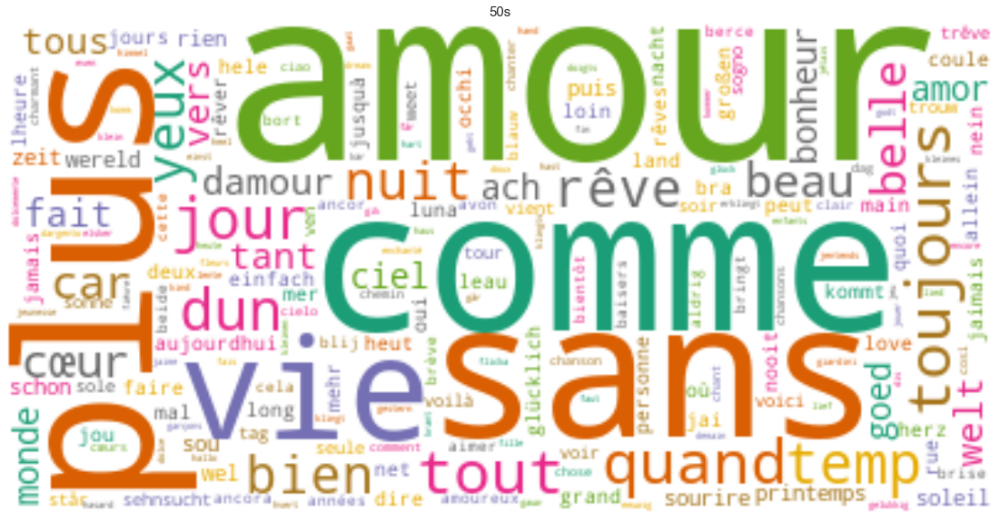

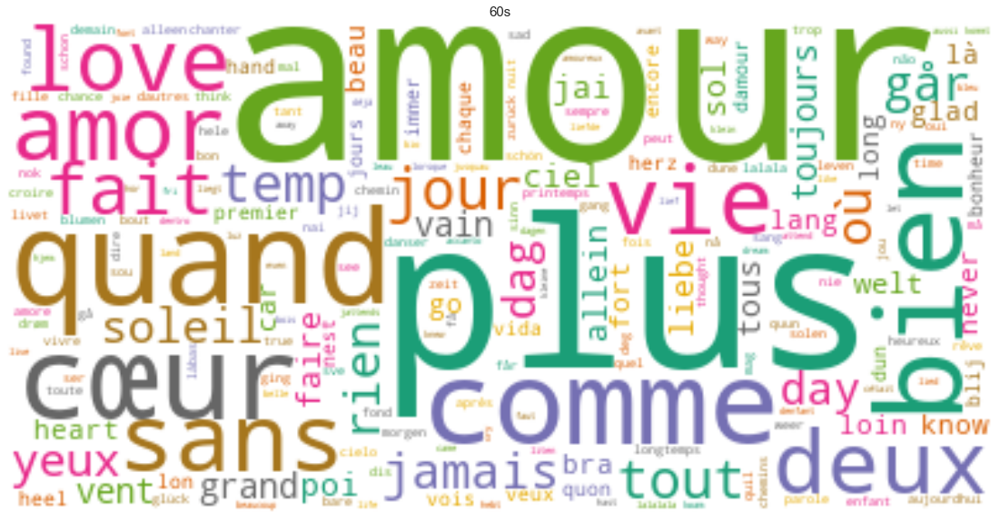

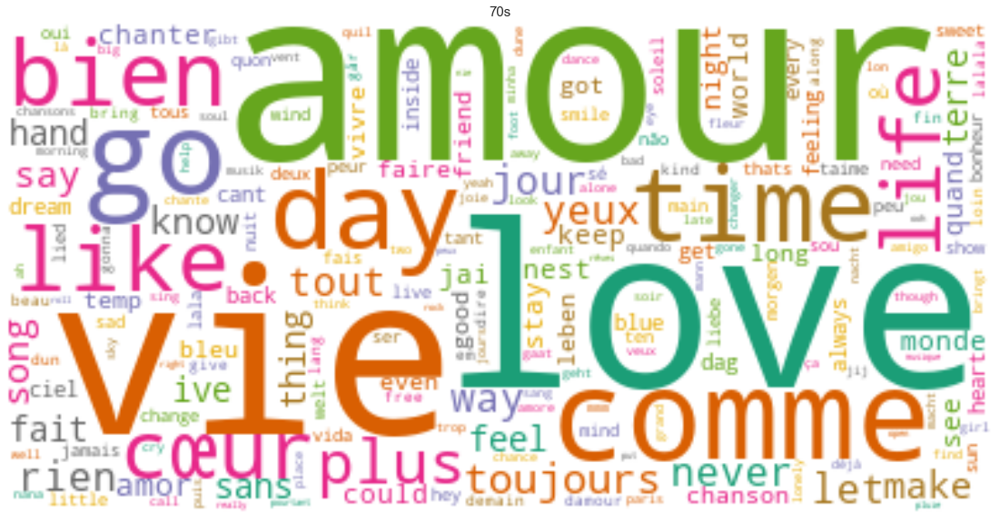

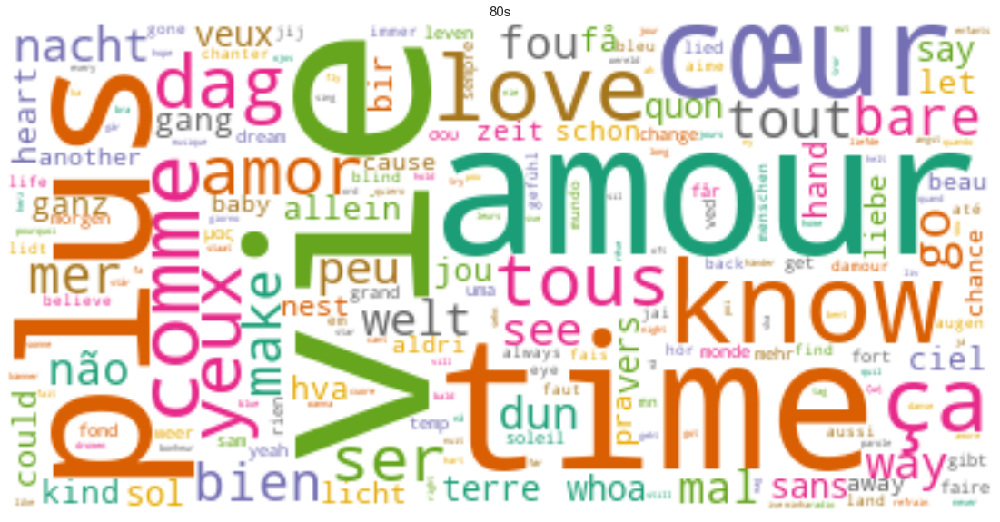

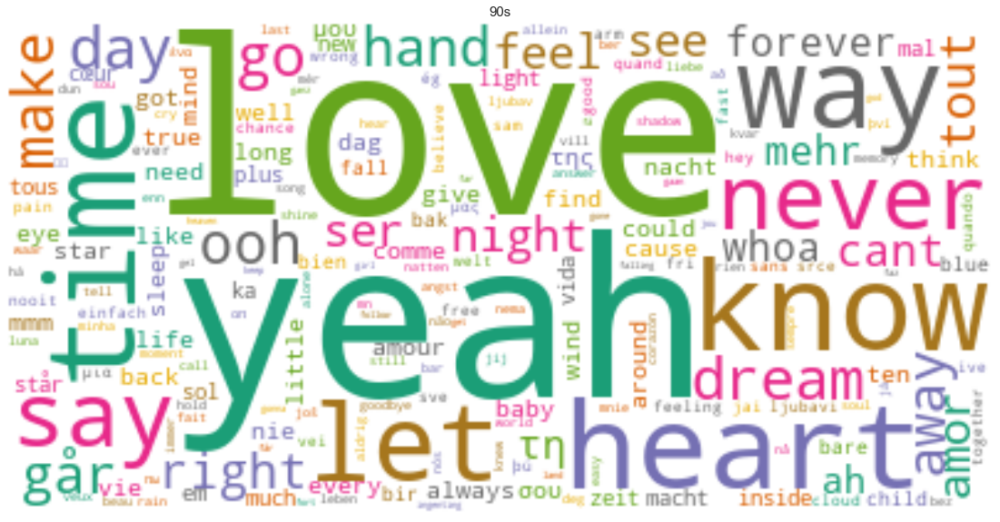

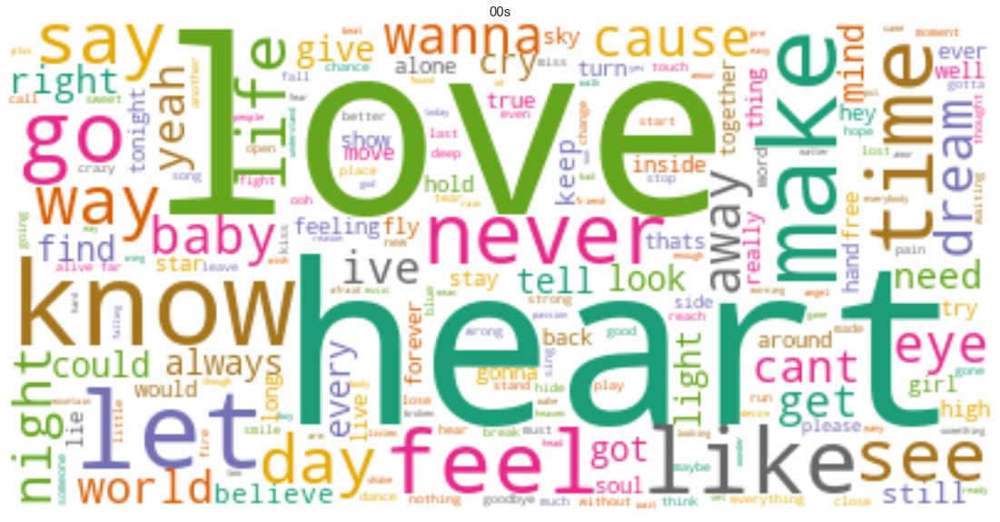

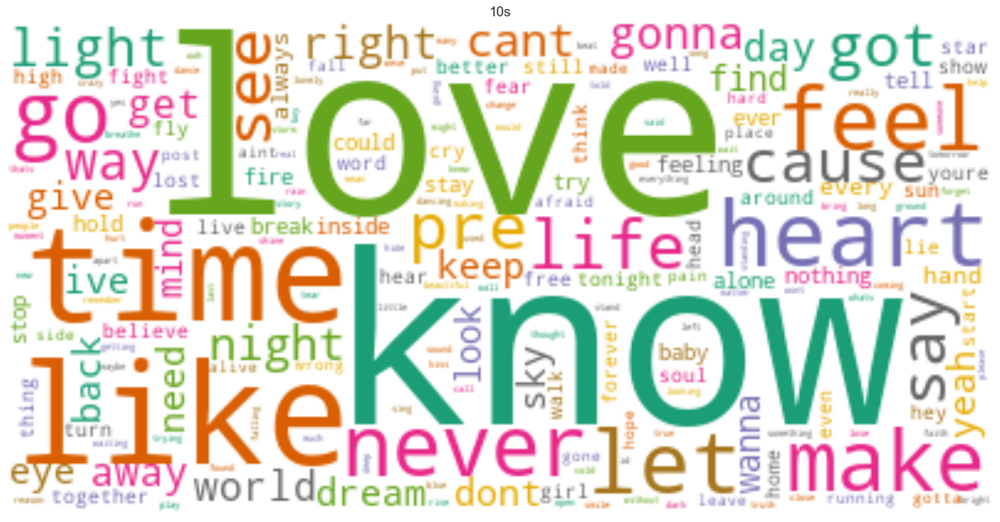

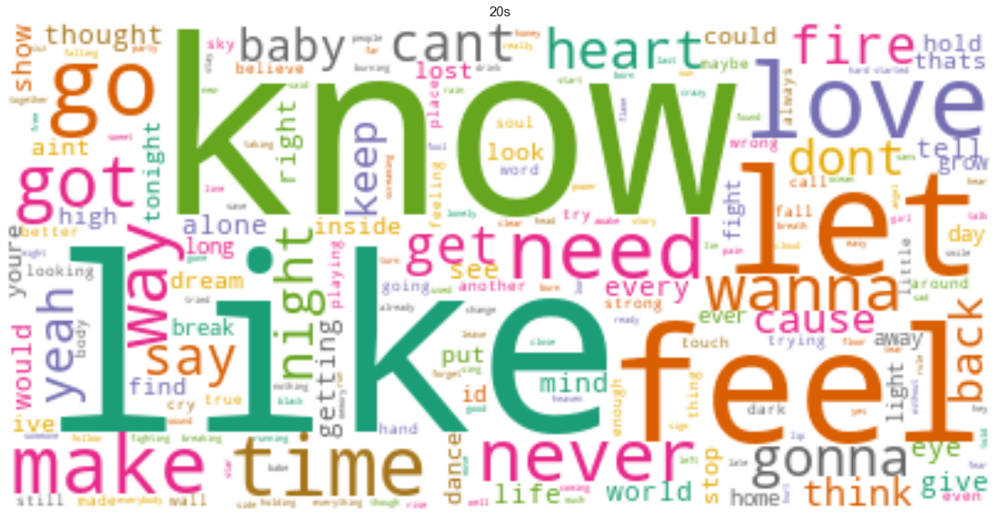

In [16]:
plot_wordcloud(df_word_list[0])
plot_wordcloud(df_word_list[1])
plot_wordcloud(df_word_list[2])
plot_wordcloud(df_word_list[3])
plot_wordcloud(df_word_list[4])
plot_wordcloud(df_word_list[5])
plot_wordcloud(df_word_list[6])
plot_wordcloud(df_word_list[7])

Function to print the word statistics for each decade.

In [17]:
def word_stats(df_list, main_df):
  unique_words = []
  total_words =  []
  total_news = []
  years = []

  for decade_df in df_list:
    for value in decade_df.columns[1:]:
      unique_words.append(np.count_nonzero(decade_df[value]))
      total_words.append(sum(decade_df[value].tolist()))
      years.append(str(value))
      total_news.append(main_df['decade'][main_df['decade']==value].count())
  data = pd.DataFrame({'decade':years, 'unique words':unique_words,'total words':total_words,'total songs':total_news})
  data['words per songs'] = round(data['total words'] / data['total songs'],0)
  data['words per songs'] = data['words per songs'].astype('int')
  return data

Run the word_stats function

In [18]:
word_stats(df_word_list, df)

,decade,unique words,total words,total songs,words per songs
0,50s,1890,2397,45,53
1,60s,5039,7382,163,45
2,70s,6124,9164,176,52
3,80s,7049,10086,200,50
4,90s,8610,12231,236,52
5,00s,7343,17038,336,51
6,10s,7941,21128,408,52
7,20s,2249,4114,80,51


**SENTIMENT ANALYSIS**

Now we are ready to conduct sentiment analysis.

Let's create text blob objects and append the sentiment to end of the dataframe.

In [19]:
#Create lists to store the different scores for each set of lyrics
sentiment = []
#Iterate for each row of lyrics and append the scores
for i in df.index:
  #Create text blobs for each of the song lyrics
  if df['Lyrics translation'].iloc[i] == "english":
    blob=TextBlob(df['Lyrics'].iloc[i])
  else:
    blob=TextBlob(df['Lyrics translation'].iloc[i])
  sentiment.append(blob.sentiment[0])
#Create a column for the sentiment score
df['sentiment'] = sentiment
df.head()

,Country,#.1,Artist,Song,Language,Pl.,Sc.,Eurovision_Number,Year,Host_Country,Host_City,Lyrics,Lyrics translation,decade,words,sentiment
0,Netherlands,1,Jetty Paerl,De vogels van Holland,Dutch,-,-,1,1956,Switzerland,Lugano,de vogels van holland zijn zo muzikaal ze lere...,the birds of holland are so musical they alrea...,50s,"[de, vogels, van, holland, zijn, zo, muzikaal,...",0.138021
1,Switzerland,1,Lys Assia,Das alte Karussell,German,-,-,1,1956,Switzerland,Lugano,das alte karussell das geht nicht mehr so schn...,the old carousel it doesn't go as fast anymore...,50s,"[da, alte, karussell, geht, nicht, mehr, schne...",0.059755
2,Belgium,1,Fud Leclerc,Messieurs les noyés de la Seine,French,-,-,1,1956,Switzerland,Lugano,messieurs les noyés de la seine ouvrezmoi les ...,ye drowned men of the river seine open the wa...,50s,"[monsieur, le, noyés, de, la, seine, ouvrezmoi...",-0.027151
3,Germany (West),1,Walter Andreas Schwarz,Im Wartesaal zum großen Glück,German,-,-,1,1956,Switzerland,Lugano,es gibt einen hafen da fährt kaum ein schiff u...,there is a harbour where hardly any ship leave...,50s,"[e, gibt, einen, hafen, da, fährt, kaum, ein, ...",0.184144
4,France,1,Mathé Altéry,Le temps perdu,French,-,-,1,1956,Switzerland,Lugano,chante carillon le chant du temps perdu chante...,sing carillon the song of lost time sing your ...,50s,"[chante, carillon, le, chant, du, temp, perdu,...",0.310317


Create a histogram of sentiments 

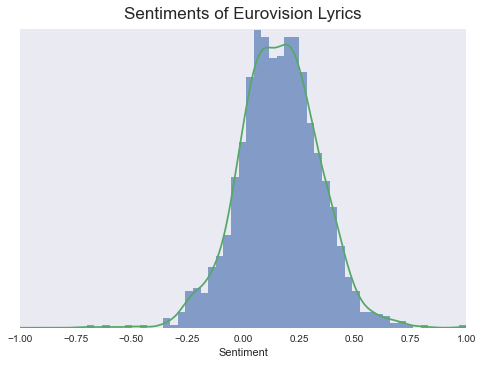

In [20]:
fig, ax = plt.subplots()

#define histograms and kde
df["sentiment"].plot(kind="hist", density=True, bins=50, alpha=0.65)
df["sentiment"].plot(kind="kde")

#Appearance settings
ax.set_xlabel("Sentiment")
ax.set_xlim(-1, 1)
ax.set_ylim(0,2.3)
ax.set_yticks([])
ax.set_ylabel("")
ax.set_title("Sentiments of Eurovision Lyrics", size=17, pad=10)
ax.tick_params(left=False, bottom=False)
plt.style.use("bmh")
ax.grid(False)
for ax, spine in ax.spines.items():
  spine.set_visible(False)


plt.show()

Split the dataframe into a separate dataframe with decades

In [21]:
df_decade = []
for d in decades:
  df_decade.append(df[df['decade'] == d])

KDE plot for each decade

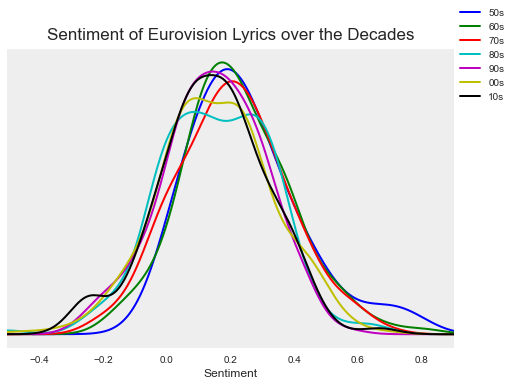

In [22]:
fig, ax = plt.subplots()
colors = "bgrcmyk"
#Print a KDE for each decade
for data, decade_c, c in zip(df_decade, decades, colors):
  data["sentiment"].plot(kind="kde", c=c, label=decade_c)
#Appearance settings
ax.set_xlabel("Sentiment")
ax.set_xlim(-0.5, 0.9)
ax.grid(False)
ax.set_xlabel("Sentiment")
ax.set_yticks([])
ax.set_ylabel("")
ax.set_title("Sentiment of Eurovision Lyrics over the Decades", size=17, pad=10)
plt.style.use("bmh")
for ax, spine in ax.spines.items():
  spine.set_visible(False)
fig.legend()
plt.show()


Confidence interval plot

The mean for the 50s is: 0.25
The CI for the 50s is: [0.196, 0.298]
The mean for the 60s is: 0.22
The CI for the 60s is: [0.195, 0.247]
The mean for the 70s is: 0.2
The CI for the 70s is: [0.178, 0.229]
The mean for the 80s is: 0.16
The CI for the 80s is: [0.132, 0.18]
The mean for the 90s is: 0.15
The CI for the 90s is: [0.127, 0.167]
The mean for the 00s is: 0.15
The CI for the 00s is: [0.13, 0.17]
The mean for the 10s is: 0.14
The CI for the 10s is: [0.127, 0.16]
The mean for the 20s is: 0.1
The CI for the 20s is: [0.057, 0.15]
['50s', '60s', '70s', '80s', '90s', '00s', '10s', '20s']


<ipython-input-23-32d10d8104ce>:24: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "ro-" (-> color='r'). The keyword argument will take precedence.
  ax.plot((y,y,y), (lower,mean,upper),'ro-',color=c)


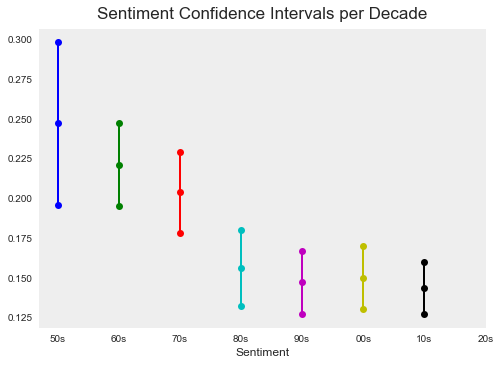

In [23]:
#Find means and confidence intervals for each decade
CIs = []
means = []
for data in df_decade:
  means.append(np.mean(data['sentiment']))
  CIs.append([round(np.mean(data['sentiment'])-1.96*sem(data['sentiment']),3), round(np.mean(data['sentiment'])+1.96*sem(data['sentiment']),3)])

#Print these
for d, c, m in zip(decades,CIs,means):
  print("The mean for the {} is: {}".format(d,round(m,2)))
  print("The CI for the {} is: {}".format(d, c))

#Create a dictionary to help plotting
ci_dict = {}
ci_dict['decades'] = decades
ci_dict['lower'] = [a[0] for a in CIs]
ci_dict['mean'] = means
ci_dict['upper'] = [a[1] for a in CIs]

#Plotting
ci_df = pd.DataFrame(ci_dict)
fig, ax = plt.subplots()
for lower,mean, upper,y,c in zip(ci_df['lower'], ci_df['mean'], ci_df['upper'],range(len(ci_df)), colors):
    ax.plot((y,y,y), (lower,mean,upper),'ro-',color=c)
ax.set_xlabel("Sentiment")
ax.grid(False)
ax.set_title("Sentiment Confidence Intervals per Decade", size=17, pad=10)
ax.set_xticks(range(len(decades)))
ax.set_xticklabels(decades)
print(decades)
plt.show()

2022 Songs Analysis

In [24]:
Artist = []
Song = []

In [25]:
Artist = ["Ronela Hajati", "Citi Zēni", "Monika Liu", "Marius Bear", "LPS", "Kalush Orchestra", "Intelligent Music Project", "S10", "Zdob și Zdub", "Maro", "Mia Dimšić", "Reddi", "Lumix", "Systur", "Amanda Georgiadi Tenfjord", "Subwoolfer", "Rosa Linn", "The Rasmus", "Michael Ben David", "Konstrakta", "Nadir Rustamli", "Circus Mircus", "Achille Lauro", "Sheldon Riley", "Andromache", "Brooke", "Andrea", "Stefan", "WRS", "Ochman", "Vladana", "Jérémie Makiese", "Cornelia Jakobs", "We Are Domi"]
Song = ["Sekret", "Eat Your Salad", "Sentimentai", "Boys Do Cry", "Disko", "Stefania", "Intention", "De diepte", "Trenulețul", "Saudade, saudade", "Guilty Pleasure", "The Show", "Halo", "Með hækkandi sól", "Die Together", "Give That Wolf a Banana", "Snap", "Jezebel", "I.M", "In corpore sano", "Fade to Black", "I Am What I Am", "Stripper", "Not the Same", "Ela", "That's Rich", "Circles", "Hope", "Llámame", "River", "Breathe", "Miss You", "Hold Me Closer", "Lights Off"]
Lyrics = []
for a, s in zip(Artist, Song):
  song = genius.search_song(s, a)
  Lyrics.append(song.lyrics)

df_2022 = pd.DataFrame(Artist, columns = ["Artist"])
df_2022["Song"] = Song
df_2022["Lyrics"] = Lyrics
df_2022

Searching for "Sekret" by Ronela Hajati...
Done.
Searching for "Eat Your Salad" by Citi Zēni...
Done.
Searching for "Sentimentai" by Monika Liu...
Done.
Searching for "Boys Do Cry" by Marius Bear...
Done.
Searching for "Disko" by LPS...
Done.
Searching for "Stefania" by Kalush Orchestra...
Done.
Searching for "Intention" by Intelligent Music Project...
Done.
Searching for "De diepte" by S10...
Done.
Searching for "Trenulețul" by Zdob și Zdub...
Done.
Searching for "Saudade, saudade" by Maro...
Done.
Searching for "Guilty Pleasure" by Mia Dimšić...
Done.
Searching for "The Show" by Reddi...
Done.
Searching for "Halo" by Lumix...
Done.
Searching for "Með hækkandi sól" by Systur...
Done.
Searching for "Die Together" by Amanda Georgiadi Tenfjord...
Done.
Searching for "Give That Wolf a Banana" by Subwoolfer...
Done.
Searching for "Snap" by Rosa Linn...
Done.
Searching for "Jezebel" by The Rasmus...
Done.
Searching for "I.M" by Michael Ben David...
Done.
Searching for "In corpore sano" by K

,Artist,Song,Lyrics
0,Ronela Hajati,Sekret,"SEKRET Lyrics[Teksti i ""SEKRET""]\n\n[Intro]\nH..."
1,Citi Zēni,Eat Your Salad,Eat Your Salad Lyrics[Verse 1]\nInstead of mea...
2,Monika Liu,Sentimentai,"Sentimentai Lyrics[Verse 1]\nTuk, tuk-tuk\nNak..."
3,Marius Bear,Boys Do Cry,Boys Do Cry Lyrics[Verse 1]\nIn my room lives ...
4,LPS,Disko,Disko LyricsBila sva v disku\nKo je LPS igral\...
5,Kalush Orchestra,Stefania,Stefania (Kalush Orchestra) Lyrics[Текст пісні...
6,Intelligent Music Project,Intention,Intention Lyrics[Verse 1]\nAnd I can move on f...
7,S10,De diepte,"De Diepte Lyrics[Songtekst van ""De Diepte""]\n\..."
8,Zdob și Zdub,Trenulețul,"Trenulețul Lyrics[Verse 1]\nMerge trenul, parc..."
9,Maro,"Saudade, saudade","​saudade, saudade Lyrics[Letra de ""saudade, sa..."


In [26]:
df_2022 = clean_lyrics(df_2022, "Lyrics")
df_2022

,Artist,Song,Lyrics
0,Ronela Hajati,Sekret,sekret teksti i sekret hej a i kujton ato ne...
1,Citi Zēni,Eat Your Salad,eat your salad instead of meat i eat veggies ...
2,Monika Liu,Sentimentai,sentimentai tuk tuktuk naktį į širdį pasibeld...
3,Marius Bear,Boys Do Cry,boys do cry in my room lives a boy who could ...
4,LPS,Disko,disko bila sva v disku ko je lps igral fičo sp...
5,Kalush Orchestra,Stefania,stefania kalush orchestra текст пісні stefania...
6,Intelligent Music Project,Intention,intention and i can move on from here how sim...
7,S10,De diepte,de diepte songtekst van de diepte ken je het...
8,Zdob și Zdub,Trenulețul,trenulețul merge trenul parcă zboară dintro ț...
9,Maro,"Saudade, saudade",saudade saudade letra de saudade saudade vers...


In [27]:
df_2022["Lyrics translation"] = pd.NaT

In [28]:
translator = Translator()

In [29]:
for i in range(0,34):
    if i in [0,2,4,5,7,8,9,13,19,22,24]:
        translation = translator.translate(df_2022['Lyrics'][i], dest='en').text
        df_2022['Lyrics translation'][i] = translation
    else:
        df_2022['Lyrics translation'][i] = df_2022['Lyrics'][i]
df_2022

<ipython-input-29-f80a0de152a8>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2022['Lyrics translation'][i] = translation
C:\Users\gunho\anaconda3\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


,Artist,Song,Lyrics,Lyrics translation
0,Ronela Hajati,Sekret,sekret teksti i sekret hej a i kujton ato ne...,Secret Text Hey Do you remember those nights '...
1,Citi Zēni,Eat Your Salad,eat your salad instead of meat i eat veggies ...,eat your salad instead of meat i eat veggies ...
2,Monika Liu,Sentimentai,sentimentai tuk tuktuk naktį į širdį pasibeld...,Sentiments Tuk Those the night in the heart of...
3,Marius Bear,Boys Do Cry,boys do cry in my room lives a boy who could ...,boys do cry in my room lives a boy who could ...
4,LPS,Disko,disko bila sva v disku ko je lps igral fičo sp...,Disk we were in the disk when lps played Fiche...
5,Kalush Orchestra,Stefania,stefania kalush orchestra текст пісні stefania...,Stefania Kalush Orchestra Texts Stefania Steph...
6,Intelligent Music Project,Intention,intention and i can move on from here how sim...,intention and i can move on from here how sim...
7,S10,De diepte,de diepte songtekst van de diepte ken je het...,The depth lyrics of the depth you know the fee...
8,Zdob și Zdub,Trenulețul,trenulețul merge trenul parcă zboară dintro ț...,The train walks the train as if flying from a ...
9,Maro,"Saudade, saudade",saudade saudade letra de saudade saudade vers...,saudade saudade letra de saudade saudade vers...


In [30]:
df_2022 = clean_lyrics(df_2022, 'Lyrics translation')
df_2022

,Artist,Song,Lyrics,Lyrics translation
0,Ronela Hajati,Sekret,sekret teksti i sekret hej a i kujton ato ne...,secret text hey do you remember those nights '...
1,Citi Zēni,Eat Your Salad,eat your salad instead of meat i eat veggies ...,eat your salad instead of meat i eat veggies ...
2,Monika Liu,Sentimentai,sentimentai tuk tuktuk naktį į širdį pasibeld...,sentiments tuk those the night in the heart of...
3,Marius Bear,Boys Do Cry,boys do cry in my room lives a boy who could ...,boys do cry in my room lives a boy who could ...
4,LPS,Disko,disko bila sva v disku ko je lps igral fičo sp...,disk we were in the disk when lps played fiche...
5,Kalush Orchestra,Stefania,stefania kalush orchestra текст пісні stefania...,stefania kalush orchestra texts stefania steph...
6,Intelligent Music Project,Intention,intention and i can move on from here how sim...,intention and i can move on from here how sim...
7,S10,De diepte,de diepte songtekst van de diepte ken je het...,the depth of the depth you know the feeling t...
8,Zdob și Zdub,Trenulețul,trenulețul merge trenul parcă zboară dintro ț...,the train walks the train as if flying from a ...
9,Maro,"Saudade, saudade",saudade saudade letra de saudade saudade vers...,saudade saudade letra de saudade saudade vers...


In [31]:
#Create lists to store the different scores for each word
sentiment = []

#Iterate for each row of lyrics and append the scores
for i in df_2022.index:
  blob = TextBlob(df_2022['Lyrics translation'].iloc[i])
  sentiment.append(blob.sentiment[0])
#Create a column to the main data frame for each score
df_2022['sentiment'] = sentiment

df_2022

,Artist,Song,Lyrics,Lyrics translation,sentiment
0,Ronela Hajati,Sekret,sekret teksti i sekret hej a i kujton ato ne...,secret text hey do you remember those nights '...,-0.065909
1,Citi Zēni,Eat Your Salad,eat your salad instead of meat i eat veggies ...,eat your salad instead of meat i eat veggies ...,0.105183
2,Monika Liu,Sentimentai,sentimentai tuk tuktuk naktį į širdį pasibeld...,sentiments tuk those the night in the heart of...,0.088889
3,Marius Bear,Boys Do Cry,boys do cry in my room lives a boy who could ...,boys do cry in my room lives a boy who could ...,-0.050000
4,LPS,Disko,disko bila sva v disku ko je lps igral fičo sp...,disk we were in the disk when lps played fiche...,0.078571
5,Kalush Orchestra,Stefania,stefania kalush orchestra текст пісні stefania...,stefania kalush orchestra texts stefania steph...,0.059252
6,Intelligent Music Project,Intention,intention and i can move on from here how sim...,intention and i can move on from here how sim...,0.173611
7,S10,De diepte,de diepte songtekst van de diepte ken je het...,the depth of the depth you know the feeling t...,0.125000
8,Zdob și Zdub,Trenulețul,trenulețul merge trenul parcă zboară dintro ț...,the train walks the train as if flying from a ...,0.173377
9,Maro,"Saudade, saudade",saudade saudade letra de saudade saudade vers...,saudade saudade letra de saudade saudade vers...,0.443182


In [32]:
print(np.mean(df_2022['sentiment']))
print([round(np.mean(df_2022['sentiment'])-1.96*sem(df_2022['sentiment']),3), round(np.mean(df_2022['sentiment'])+1.96*sem(df_2022['sentiment']),3)])

0.08424978933370801
[0.039, 0.129]


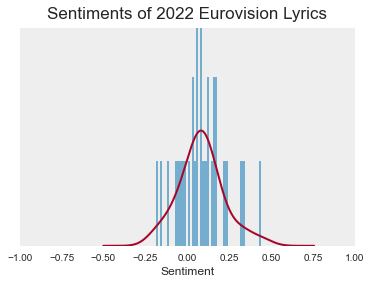

In [33]:
fig, ax = plt.subplots(figsize=(6,4))
#define histograms and kde
df_2022["sentiment"].plot(kind="hist", density=True, bins=50, alpha=0.65)
df_2022["sentiment"].plot(kind="kde")

#Appearance Settings
ax.set_xlabel("Sentiment")
ax.set_xlim(-1, 1)
ax.set_ylim(0,6)
ax.set_yticks([])
ax.set_ylabel("")
ax.set_title("Sentiments of 2022 Eurovision Lyrics", size=17, pad=10)
ax.tick_params(left=False, bottom=False)
plt.style.use("bmh")
ax.grid(False)
for ax, spine in ax.spines.items():
  spine.set_visible(False)



plt.show()

In [34]:
#Stores unique words of each lyrics song into a new column called words
#list used to store the words
words = []
#iterate trought each lyric and split unique words appending the result into the words list
df_2022 = df_2022.reset_index(drop=True)
for word in df_2022['Lyrics translation'].tolist():
    words.append(unique(lyrics_to_words(word).split()))
#create the new column with the information of words lists
df_2022['words'] = words
df_2022.head()

,Artist,Song,Lyrics,Lyrics translation,sentiment,words
0,Ronela Hajati,Sekret,sekret teksti i sekret hej a i kujton ato ne...,secret text hey do you remember those nights '...,-0.065909,"[secret, text, hey, remember, night, are, inte..."
1,Citi Zēni,Eat Your Salad,eat your salad instead of meat i eat veggies ...,eat your salad instead of meat i eat veggies ...,0.105183,"[eat, salad, instead, meat, veggie, pussy, lik..."
2,Monika Liu,Sentimentai,sentimentai tuk tuktuk naktį į širdį pasibeld...,sentiments tuk those the night in the heart of...,0.088889,"[sentiment, tuk, night, heart, longing, full, ..."
3,Marius Bear,Boys Do Cry,boys do cry in my room lives a boy who could ...,boys do cry in my room lives a boy who could ...,-0.050000,"[boy, cry, room, life, could, blue, might, nev..."
4,LPS,Disko,disko bila sva v disku ko je lps igral fičo sp...,disk we were in the disk when lps played fiche...,0.078571,"[disk, lp, played, fiche, whispering, seemed, ..."


In [35]:
#Create a data_frame of words used per decade
stop_words.append("pre")
set_words = []
set_year = []
for i in df_2022.index:
  for word in df_2022['words'].loc[i]:
    if word == 'lamour':
      set_words.append('amour') #replace l'amour with amour
    else:
      set_words.append(word)
    set_year.append(2022)
words_df = pd.DataFrame({'words':set_words, 'year':set_year})

#Count the word frequencies per decade and place them into a list of datasets per decade
cv = CountVectorizer(stop_words = stop_words)
text_cv = cv.fit_transform(words_df['words'])
data_cv = pd.DataFrame(text_cv.toarray(), columns=cv.get_feature_names())
data_cv['year'] = words_df['year']
vect_words = data_cv.groupby('year').sum().T
vect_words = vect_words.reset_index(level=0).rename(columns = {'index':'words'})
vect_words = vect_words.rename_axis(columns='')
vect_words = vect_words[['words', 2022]]

C:\Users\gunho\anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:383: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['printr', 'δι', 'آمين', 'أب', 'أخ', 'أفعل', 'أفعله', 'ؤلاء', 'إل', 'إم', 'ات', 'اتان', 'ارتد', 'ان', 'انفك', 'برح', 'تان', 'تبد', 'تحو', 'تعل', 'حد', 'حم', 'حي', 'خب', 'ذار', 'سيما', 'صه', 'ظل', 'ظن', 'عد', 'قط', 'مر', 'مكان', 'مكانكن', 'نب', 'هات', 'هب', 'واها', 'وراء', 'ἀλλ'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


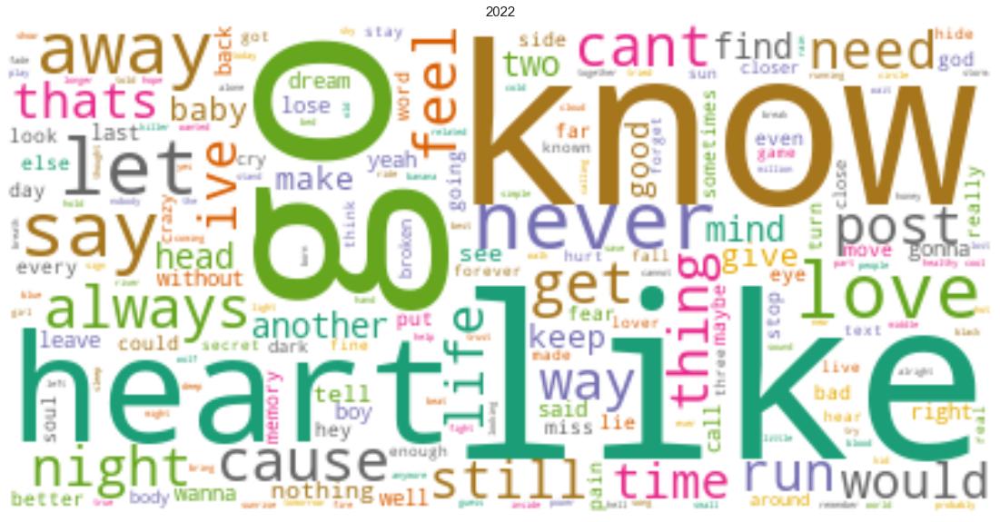

In [36]:
plot_wordcloud(vect_words)

gensim Analysis

In [37]:
# create array of lyrics
text_corpus = []
for lyrics in df_2022["Lyrics translation"]:
    text_corpus.append(lyrics)

In [38]:
# Create a set of frequent words
stoplist = set('for a of the and to in'.split(' '))
# Lowercase each document, split it by white space and filter out stopwords
texts = [[word for word in document.lower().split() if word not in stoplist]
         for document in text_corpus]

# Count word frequencies
from collections import defaultdict
frequency = defaultdict(int)
for text in texts:
    for token in text:
        frequency[token] += 1

# Only keep words that appear more than once
processed_corpus = [[token for token in text if frequency[token] > 1] for text in texts]
pprint.pprint(processed_corpus)

[['secret',
  'text',
  'hey',
  'do',
  'you',
  'remember',
  'those',
  'nights',
  'only',
  'secret',
  'interlude',
  'come',
  'on',
  'go',
  'run',
  'get',
  'up',
  'get',
  'up',
  'run',
  'get',
  'up',
  'run',
  'get',
  'up',
  'come',
  'ej',
  'ej',
  'ej',
  'ej',
  'go',
  'go',
  'boy',
  'from',
  'mountains',
  'he',
  'here',
  'find',
  'it',
  'mad',
  'i',
  'i',
  'it',
  'an',
  'baby',
  'come',
  'my',
  'hands',
  'on',
  'your',
  'body',
  'body',
  'on',
  'closer',
  'me',
  'ya',
  'with',
  'hey',
  "'cause",
  'i',
  'love',
  'ya',
  'hey',
  'with',
  'come',
  'baby',
  'put',
  'it',
  'on',
  'me',
  'hey',
  'i',
  'will',
  'never',
  'regret',
  'you',
  'will',
  'be',
  'my',
  'second',
  'feel',
  'my',
  'body',
  'tocatócalo',
  'i',
  'like',
  'it',
  'hey',
  'i',
  'will',
  'never',
  'regret',
  'you',
  'will',
  'keep',
  'my',
  'second',
  'you',
  "don't",
  'know',
  'how',
  'i',
  'did',
  'not',
  'know',
  'how',
  '

  'guess',
  "let's",
  'go',
  'you',
  'say',
  'grandma',
  'best',
  'ohoohoohoohoohooh',
  'jim',
  'all',
  'jim',
  'keith',
  'dj',
  'astronaut',
  'before',
  'that',
  'wolf',
  'eats',
  'my',
  'grandma',
  'give',
  'that',
  'wolf',
  'banana',
  'give',
  'that',
  'wolf',
  'i',
  'want',
  'your',
  'grandma',
  'yum',
  'yum',
  'before',
  'that',
  'wolf',
  'eats',
  'my',
  'grandma',
  'give',
  'that',
  'wolf',
  'banana',
  'give',
  'that',
  'wolf',
  'give',
  'that',
  'wolf',
  'someone',
  'give',
  'that',
  'wolf',
  'banana',
  'related',
  'that',
  'wolf',
  'jim',
  'keith',
  'all',
  'yum',
  'yum',
  'yum',
  'yumyumyum',
  'yum',
  'yum',
  'yum',
  'yum',
  'yum',
  'yum',
  'yumyumyum',
  'someone',
  'give',
  'that',
  'wolf',
  'banana',
  'yum',
  'yum',
  'yum',
  'yumyumyum',
  'yum',
  'yum',
  'yum',
  'yum',
  'yum',
  'yum',
  'yumyumyum',
  'someone',
  'give',
  'that',
  'wolf',
  'banana',
  'interlude',
  'jim',
  'keith',
  '

  'hold',
  'me',
  'bjoern',
  'pretty',
  'timms',
  'emma',
  'act',
  'ur',
  'age',
  'lizzy',
  'cruz',
  'natalie',
  'madigan',
  'i',
  'need',
  'you',
  'cat',
  'alex',
  'been',
  'you',
  'sarah',
  'taylor',
  'choose',
  'anna',
  '00',
  'update',
  'savannah',
  'sgro',
  'human',
  'heights',
  'storm',
  'beast',
  'alicia',
  'blue',
  'tell',
  'me',
  'now',
  'kit',
  "it's",
  'just',
  'like',
  'all',
  'clouds',
  'mind',
  'kit',
  'all',
  'your',
  'fault',
  'halo',
  'kitsch',
  'lola',
  '900',
  'update',
  'time',
  'at',
  'alicia',
  'fade',
  'into',
  'view',
  'low',
  'are',
  'you',
  'listening',
  'sometimes',
  'boy',
  'gayle',
  'wait',
  "andrews'",
  'up',
  'down',
  "don't",
  'you',
  'save',
  'us',
  'crystal',
  'just',
  'feeling',
  'feat',
  'el',
  'de',
  'pop',
  'woods',
  'self',
  'care',
  'george',
  'rose',
  'day',
  'girl',
  'love',
  'forever',
  'self',
  'be',
  'true',
  'talk',
  'talk',
  'talk',
  'old',
  'c

  'when',
  'i',
  'miss',
  'you',
  "you're",
  "sailin'",
  'around',
  'my',
  'peripheral',
  'where',
  'are',
  'you',
  'now',
  'where',
  'are',
  'you',
  'now',
  'where',
  'are',
  'you',
  'now',
  'where',
  'are',
  'you']]


In [39]:
dictionary = corpora.Dictionary(processed_corpus)
print(dictionary)

Dictionary(1150 unique tokens: ["'cause", 'an', 'baby', 'be', 'beat']...)


In [40]:
bow_corpus = [dictionary.doc2bow(text) for text in processed_corpus]
pprint.pprint(bow_corpus)

[[(0, 1),
  (1, 1),
  (2, 3),
  (3, 2),
  (4, 1),
  (5, 3),
  (6, 1),
  (7, 1),
  (8, 4),
  (9, 3),
  (10, 3),
  (11, 4),
  (12, 1),
  (13, 1),
  (14, 4),
  (15, 1),
  (16, 1),
  (17, 1),
  (18, 1),
  (19, 7),
  (20, 3),
  (21, 1),
  (22, 1),
  (23, 1),
  (24, 1),
  (25, 11),
  (26, 4),
  (27, 18),
  (28, 1),
  (29, 8),
  (30, 6),
  (31, 1),
  (32, 6),
  (33, 1),
  (34, 3),
  (35, 1),
  (36, 6),
  (37, 1),
  (38, 5),
  (39, 1),
  (40, 1),
  (41, 7),
  (42, 4),
  (43, 1),
  (44, 1),
  (45, 4),
  (46, 3),
  (47, 1),
  (48, 2),
  (49, 1),
  (50, 1),
  (51, 4),
  (52, 1),
  (53, 3),
  (54, 2),
  (55, 3),
  (56, 3),
  (57, 1),
  (58, 4),
  (59, 1),
  (60, 1),
  (61, 1),
  (62, 2),
  (63, 2),
  (64, 2),
  (65, 4),
  (66, 4),
  (67, 3),
  (68, 7),
  (69, 2),
  (70, 2),
  (71, 1),
  (72, 10),
  (73, 1)],
 [(0, 1),
  (1, 1),
  (2, 2),
  (11, 2),
  (13, 12),
  (19, 1),
  (20, 3),
  (27, 3),
  (29, 1),
  (32, 6),
  (34, 2),
  (38, 2),
  (41, 7),
  (46, 1),
  (61, 1),
  (62, 1),
  (65, 1),
  (67, 

  (422, 1),
  (427, 2),
  (433, 2),
  (441, 5),
  (461, 1),
  (482, 5),
  (502, 4),
  (510, 5),
  (523, 3),
  (535, 2),
  (597, 2),
  (600, 7),
  (622, 3),
  (632, 3),
  (712, 9),
  (738, 2),
  (762, 2),
  (858, 2),
  (996, 2),
  (1102, 2),
  (1103, 2),
  (1104, 3),
  (1105, 5),
  (1106, 5),
  (1107, 3),
  (1108, 2),
  (1109, 5)],
 [(3, 5),
  (6, 3),
  (10, 2),
  (11, 1),
  (15, 3),
  (24, 1),
  (25, 3),
  (27, 32),
  (29, 1),
  (32, 1),
  (41, 2),
  (42, 2),
  (49, 2),
  (57, 4),
  (66, 3),
  (68, 1),
  (70, 9),
  (72, 1),
  (73, 5),
  (74, 6),
  (97, 2),
  (99, 1),
  (101, 3),
  (102, 1),
  (114, 1),
  (115, 3),
  (120, 2),
  (130, 1),
  (132, 2),
  (139, 1),
  (141, 3),
  (142, 3),
  (156, 3),
  (173, 2),
  (193, 1),
  (204, 2),
  (206, 10),
  (208, 9),
  (210, 4),
  (231, 2),
  (236, 3),
  (252, 1),
  (256, 1),
  (305, 2),
  (311, 6),
  (322, 1),
  (325, 1),
  (327, 2),
  (343, 29),
  (354, 1),
  (387, 1),
  (416, 1),
  (418, 9),
  (421, 1),
  (422, 2),
  (427, 2),
  (438, 2),
  (4

In [41]:
from gensim import models
# train the model
tfidf = models.TfidfModel(bow_corpus)

In [42]:
index = similarities.SparseMatrixSimilarity(tfidf[bow_corpus], num_features=1145)

In [43]:
#similatry matrix
sim_mat = pd.DataFrame()
for i in df_2022.index:
    query_document = df_2022["Lyrics translation"][i].split()
    query_bow = dictionary.doc2bow(query_document)
    sims = index[tfidf[query_bow]]
    sim_mat[i] = sims
pprint.pprint(sim_mat)

          0         1         2         3         4         5         6   \
0   1.000000  0.028726  0.038564  0.061709  0.051305  0.035855  0.041150   
1   0.028726  1.000000  0.011355  0.011676  0.020230  0.012086  0.016182   
2   0.038564  0.011355  1.000000  0.025960  0.065005  0.009848  0.017819   
3   0.061709  0.011676  0.025960  1.000000  0.031705  0.028569  0.047574   
4   0.051305  0.020230  0.065005  0.031705  1.000000  0.039442  0.066235   
5   0.035855  0.012086  0.009848  0.028569  0.039442  1.000000  0.036294   
6   0.041150  0.016182  0.017819  0.047574  0.066235  0.036294  1.000000   
7   0.032582  0.010974  0.015485  0.027426  0.071674  0.027191  0.028996   
8   0.066196  0.006478  0.052410  0.022231  0.029881  0.006647  0.009486   
9   0.013653  0.006227  0.013242  0.011258  0.031219  0.005737  0.023728   
10  0.091559  0.007737  0.080574  0.095496  0.116206  0.040881  0.076338   
11  0.116884  0.017091  0.034375  0.019636  0.113776  0.054745  0.091442   
12  0.016737

In [44]:
sim_mat.style.background_gradient(cmap='tab20', axis=None).set_precision(3) #coolwarm tab20

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33
0,1.000,0.029,0.039,0.062,0.051,0.036,0.041,0.033,0.066,0.014,0.092,0.117,0.017,0.010,0.042,0.005,0.066,0.023,0.102,0.026,0.007,0.067,0.045,0.046,0.111,0.042,0.047,0.072,0.014,0.024,0.017,0.036,0.063,0.025
1,0.029,1.000,0.011,0.012,0.020,0.012,0.016,0.011,0.006,0.006,0.008,0.017,0.021,0.003,0.010,0.003,0.013,0.014,0.024,0.125,0.006,0.051,0.021,0.019,0.006,0.016,0.009,0.007,0.007,0.005,0.025,0.025,0.010,0.010
2,0.039,0.011,1.000,0.026,0.065,0.010,0.018,0.015,0.052,0.013,0.081,0.034,0.009,0.000,0.026,0.005,0.038,0.019,0.024,0.016,0.042,0.058,0.049,0.041,0.018,0.014,0.028,0.014,0.012,0.020,0.014,0.032,0.015,0.133
3,0.062,0.012,0.026,1.000,0.032,0.029,0.048,0.027,0.022,0.011,0.095,0.020,0.010,0.009,0.054,0.016,0.046,0.011,0.028,0.013,0.010,0.062,0.017,0.045,0.018,0.045,0.034,0.049,0.013,0.043,0.060,0.043,0.026,0.011
4,0.051,0.020,0.065,0.032,1.000,0.039,0.066,0.072,0.030,0.031,0.116,0.114,0.043,0.044,0.145,0.018,0.052,0.035,0.073,0.026,0.051,0.100,0.086,0.129,0.108,0.034,0.047,0.031,0.015,0.017,0.052,0.084,0.077,0.066
5,0.036,0.012,0.010,0.029,0.039,1.000,0.036,0.027,0.007,0.006,0.041,0.055,0.016,0.011,0.022,0.003,0.013,0.020,0.037,0.011,0.008,0.051,0.021,0.045,0.033,0.015,0.023,0.012,0.004,0.012,0.010,0.008,0.024,0.011
6,0.041,0.016,0.018,0.048,0.066,0.036,1.000,0.029,0.009,0.024,0.076,0.091,0.018,0.012,0.047,0.003,0.022,0.020,0.061,0.010,0.023,0.059,0.022,0.060,0.013,0.051,0.054,0.032,0.007,0.064,0.058,0.063,0.077,0.025
7,0.033,0.011,0.015,0.027,0.072,0.027,0.029,1.000,0.005,0.011,0.033,0.063,0.012,0.008,0.021,0.030,0.022,0.011,0.103,0.022,0.018,0.051,0.041,0.037,0.032,0.020,0.013,0.058,0.011,0.018,0.018,0.062,0.038,0.020
8,0.066,0.006,0.052,0.022,0.030,0.007,0.009,0.005,1.000,0.000,0.004,0.017,0.001,0.000,0.035,0.003,0.026,0.013,0.009,0.005,0.005,0.020,0.014,0.020,0.008,0.008,0.001,0.009,0.004,0.000,0.010,0.004,0.019,0.118
9,0.014,0.006,0.013,0.011,0.031,0.006,0.024,0.011,0.000,1.000,0.021,0.026,0.010,0.005,0.025,0.005,0.022,0.004,0.027,0.015,0.005,0.039,0.014,0.035,0.002,0.018,0.020,0.007,0.002,0.013,0.022,0.018,0.025,0.031


<AxesSubplot:>

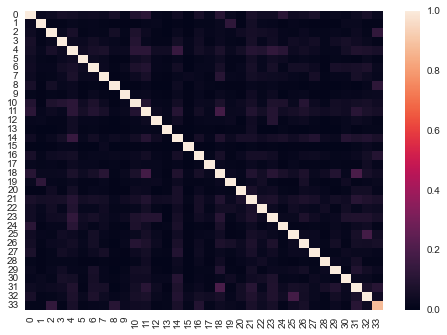

In [45]:
import seaborn as sns
sns.heatmap(sim_mat, 
            xticklabels=sim_mat.columns.values,
            yticklabels=sim_mat.columns.values)

In summary, the sentiment score was, on average, 0.225 (-1 to 1 scale) from the 1950s to 1970s. From the 1980s to 2010s, it decreased to 0.150.

Looking at 2022 specifically, the average sentiment score for all songs is 0.0842, with a confidence interval of [0.039, 0.129]. The most positive was the song **“Hope”** by Stefan. The most popular words were “know” and “go”. 

Using the gensim package and analysis, it is possible to compare each song to each other and see how similar or different they are to each other. Looking at 2022 the lowest similarities were practically 0. The highest similarities were 0.173, which was between “Miss You” by Jérémie Makiese and “I.M” by Micheal Ben David. 

Overall, these results show that Eurovision songs are overall positive songs about love, life, knowing, and going. They aren’t very similar on a lyrical level. As time goes on, it may also be the case that more song subjects are acceptable, leading to more variability in song lyrics, both within songs and between songs. It also seems that the most positive or negative songs don’t win or lose, nor do the most unique. 

Analyzing every song in the dataset and comparing them to each other

In [ ]:
# create array of lyrics
text_corpus_big = []
for i in df.index:
    if (df["Lyrics translation"][i] == "english"):
        text_corpus_big.append(df["Lyrics"][i])
    else:
        text_corpus_big.append(df["Lyrics translation"][i])
        
for lyrics in df_2022["Lyrics translation"]:
    text_corpus_big.append(lyrics)

In [ ]:
# Create a set of frequent words
stoplist = set('for a of the and to in'.split(' '))
# Lowercase each document, split it by white space and filter out stopwords
texts = [[word for word in document.lower().split() if word not in stoplist]
         for document in text_corpus_big]

# Count word frequencies
from collections import defaultdict
frequency = defaultdict(int)
for text in texts:
    for token in text:
        frequency[token] += 1

# Only keep words that appear more than once
processed_corpus = [[token for token in text if frequency[token] > 1] for text in texts]
#pprint.pprint(processed_corpus)

In [ ]:
dictionary = corpora.Dictionary(processed_corpus)
print(dictionary)

In [ ]:
bow_corpus = [dictionary.doc2bow(text) for text in processed_corpus]
#pprint.pprint(bow_corpus)

In [ ]:
from gensim import models
# train the model
tfidf = models.TfidfModel(bow_corpus)

In [ ]:
index = similarities.SparseMatrixSimilarity(tfidf[bow_corpus], num_features=7238)

In [ ]:
# similatry matrix for every song in the entire dataset
#sim_mat = pd.DataFrame()

#for i, lyrics in enumerate(text_corpus_big):
#    query_document = lyrics.split()
#    query_bow = dictionary.doc2bow(query_document)
#    sims = index[tfidf[query_bow]]
#    sim_mat[i] = sims
#pprint.pprint(sim_mat)

### NLP via PyCaret

PyCaret also provides a great package to implement Natural Language Processing.

With the processed data, we are going to apply this.

In [3]:
#This data is going to be used for pycaret
#df.head()

In [2]:
#We take 1000 random samples out of it to build a model.
#df_sample = df.sample(1000, random_state= 123).reset_index(drop = True)

In [1]:
#df_sample.head()

In [ ]:
data = df.sample(frac=0.95, random_state=777)
data_unseen = df.drop(data.index)

data.reset_index(inplace=True, drop=True)
data_unseen.reset_index(inplace=True, drop=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions ' + str(data_unseen.shape))

In [49]:
df_nlp = df[["Country","Artist","Song","Language","Year","Lyrics","Lyrics translation","words"]]

In [ ]:
#This is very important to run pycaret.nlp
#!pip install spacy==2.3.1
#!python -m spacy download en_core_web_sm

In [50]:
import spacy

In [51]:
nlp = spacy.load("en_core_web_sm")
doc = nlp("Text here")

In [52]:
from pycaret.nlp import *

In [53]:
#nlp = en_core_web_sm.load()
nlp1 = setup(data = df_nlp, target = 'Lyrics translation', session_id = 121)

Description,Value
session_id,121
Documents,1644
Vocab Size,4858
Custom Stopwords,False


In [55]:
lda = create_model('lda', num_topics = 6, multi_core = True)

In [56]:
lda_result = assign_model(lda)

In [57]:
lda_result.head()

,Country,Artist,Song,Language,Year,Lyrics,Lyrics translation,words,Topic_0,Topic_1,Topic_2,Topic_3,Topic_4,Topic_5,Dominant_Topic,Perc_Dominant_Topic
0,Netherlands,Jetty Paerl,De vogels van Holland,Dutch,1956,de vogels van holland zijn zo muzikaal ze lere...,already learn early youth blackbird nowhere pu...,"[de, vogels, van, holland, zijn, zo, muzikaal,...",0.002372,0.634408,0.002371,0.356112,0.002374,0.002364,Topic 1,0.63
1,Switzerland,Lys Assia,Das alte Karussell,German,1956,das alte karussell das geht nicht mehr so schn...,old go fast anymore pony wagone want get go fl...,"[da, alte, karussell, geht, nicht, mehr, schne...",0.002207,0.988948,0.002210,0.002209,0.002223,0.002205,Topic 1,0.99
2,Belgium,Fud Leclerc,Messieurs les noyés de la Seine,French,1956,messieurs les noyés de la seine ouvrezmoi les ...,open water gate tired spending week black pave...,"[monsieur, le, noyés, de, la, seine, ouvrezmoi...",0.177489,0.002160,0.143731,0.002159,0.002154,0.672306,Topic 5,0.67
3,Germany (West),Walter Andreas Schwarz,Im Wartesaal zum großen Glück,German,1956,es gibt einen hafen da fährt kaum ein schiff u...,hardly ship leave leave leave unknown distance...,"[e, gibt, einen, hafen, da, fährt, kaum, ein, ...",0.001178,0.001178,0.001177,0.921570,0.073719,0.001178,Topic 3,0.92
4,France,Mathé Altéry,Le temps perdu,French,1956,chante carillon le chant du temps perdu chante...,sing carillon song lose time sing song fiery h...,"[chante, carillon, le, chant, du, temp, perdu,...",0.525109,0.002006,0.001997,0.466879,0.002000,0.002009,Topic 0,0.53


In [58]:
lda_result.Dominant_Topic.value_counts()

Topic 0    845
Topic 3    221
Topic 1    199
Topic 5    195
Topic 2    140
Topic 4     44
Name: Dominant_Topic, dtype: int64

In [59]:
plot_model(lda, plot = 'frequency')

In [60]:
plot_model()

In [61]:
plot_model(plot = 'bigram')

In [62]:
plot_model(lda, plot = 'frequency', topic_num = "Topic 1")

In [63]:
plot_model(lda, plot = 'topic_distribution')

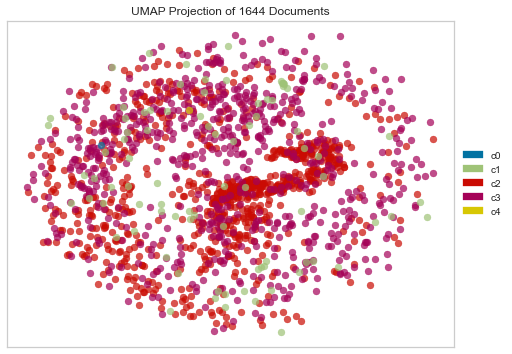

In [64]:
plot_model(lda, plot = 'umap')

In [66]:
plot_model(lda, plot = 'tsne')

In [65]:
evaluate_model(lda)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Frequency Plot', 'freque…

In [67]:
save_model(lda, 'NLP_lda')

Model Succesfully Saved


(<gensim.models.ldamulticore.LdaMulticore at 0x202c3961ca0>, 'NLP_lda.pkl')

# GRAPHS
<a name='graphs'></a>

[**Neo4j**](https://neo4j.com/) is the main software used in this section to perform graph data science.

We discovered that the provided query `x-[VOTE]-Y` was not optimal to do the graph analysis especially in the context of graph algorithms.  

The alternative is as follows: Label your relationships by `year` instead of `category`. Here is the example: `x-[VOTE_2012]-Y)`

This query gives us more possibilities to work with the data on a yearly basis and makes the algorithms work properly. Otherwise you create 12 times the same nodes as countries and 12 different VOTE relationships and you start connecting nodes that shouldn’t connect with each other.

Second the node properties Winner: Yes/No don't bring any value to our analysis because it is not specified for each year again, so the algorithms compute it the wrong way (for instance Sweden has won multiple times but will only get one point). So we drop the node properties.

We changed the code so that the nodes are always static and the same. And we give to the nodes multiple relationship types with relationship properties, specified for each year. For example Belgium will have for each year relationship types with votes for different countries with a different score. ( this code makes it easier for the machine that there are very few nodes but a lot of different connections with each other with different weights to them).

In [ ]:
#Introduction to Neo4j

## Graph Algorithms
<a name='GA'></a>

In [ ]:
#use Graph algorithms and explain what they are

In [ ]:
from neo4j import GraphDatabase

class HelloWorldExample:

    def __init__(self, uri, user, password):
        self.driver = GraphDatabase.driver(uri, auth=(user, password))

    def close(self):
        self.driver.close()

    def print_greeting(self, message):
        with self.driver.session() as session:
            greeting = session.write_transaction(self._create_and_return_greeting, message)
            print(greeting)

    @staticmethod
    def _create_and_return_greeting(tx, message):
        result = tx.run("CREATE (a:Greeting) "
                        "SET a.message = $message "
                        "RETURN a.message + ', from node ' + id(a)", message=message)
        return result.single()[0]


if __name__ == "__main__":
    greeter = HelloWorldExample("bolt://localhost:7687", "neo4j", "password")
    greeter.print_greeting("hello, world")
    greeter.close()

In [ ]:
from py2neo import Graph
graph = Graph("bolt://localhost:7687", auth=("neo4j", "password"))
graph.run("UNWIND range(1, 3) AS n RETURN n, n * n as n_sq")

In [ ]:
class Neo4jConnection:
    
    def __init__(self, uri, user, pwd):
        
        self.__uri = uri
        self.__user = user
        self.__pwd = pwd
        self.__driver = None
        
        try:
            self.__driver = GraphDatabase.driver(self.__uri, auth=(self.__user, self.__pwd))
        except Exception as e:
            print("Failed to create the driver:", e)
        
    def close(self):
        
        if self.__driver is not None:
            self.__driver.close()
        
    def query(self, query, parameters=None, db=None):
        
        assert self.__driver is not None, "Driver not initialized!"
        session = None
        response = None
        
        try: 
            session = self.__driver.session(database=db) if db is not None else self.__driver.session() 
            response = list(session.run(query, parameters))
        except Exception as e:
            print("Query failed:", e)
        finally: 
            if session is not None:
                session.close()
        return response

In [ ]:
uri = 'bolt://localhost:7687'
pwd = ''

conn = Neo4jConnection(uri=uri, user="neo4j", pwd=pwd)

conn.query('MATCH (n) DETACH DELETE n')

RESET THE NODES and UPLOAD AGAIN

In [ ]:
conn.query('MATCH (n) RETURN COUNT(n)')

In [ ]:
query = """CALL gds.graph.project(
          'eurosong2012',            
          'Country',             
          'VOTE_2012',
          {
            relationshipProperties: 'score'
          }              
        )
"""

conn.query(query)

In [ ]:
query = """CALL gds.graph.project(
          'eurosong2022',            
          'Country',             
          'VOTE_2022',
          {
            relationshipProperties: 'score'
          }              
        )
"""

conn.query(query)

In [ ]:
pagerank = """CALL gds.pageRank.stream('eurosong2012', {
              maxIterations: 20,
              dampingFactor: 0.85,
              relationshipWeightProperty: 'score'
              }) YIELD nodeId, score
              RETURN gds.util.asNode(nodeId).name AS name, gds.util.asNode(nodeId).winner AS winner, score
              ORDER BY score DESC, name ASC
"""

In [ ]:
pagerank_write = """CALL gds.pageRank.write('eurosong2012', {
              maxIterations: 20,
              dampingFactor: 0.85,
              relationshipWeightProperty: 'score',
              writeProperty: 'pagerank2012'
            })
            YIELD nodePropertiesWritten, ranIterations
            RETURN nodePropertiesWritten, ranIterations
"""

In [ ]:
verification = """MATCH (c:Country)
RETURN c.name, c.pagerank2012, c.winner 
ORDER by c.pagerank2012 DESC
LIMIT 5;"""

In [ ]:
conn.query(pagerank)

In [ ]:
pagerank = """CALL gds.pageRank.stream('eurosong2022', {
              maxIterations: 20,
              dampingFactor: 0.85,
              relationshipWeightProperty: 'score'
              }) YIELD nodeId, score
              RETURN gds.util.asNode(nodeId).name AS name, gds.util.asNode(nodeId).winner AS winner, score
              ORDER BY score DESC, name ASC
"""

In [ ]:
pagerank_write = """CALL gds.pageRank.write('eurosong2022', {
              maxIterations: 20,
              dampingFactor: 0.85,
              relationshipWeightProperty: 'score',
              writeProperty: 'pagerank2012'
            })
            YIELD nodePropertiesWritten, ranIterations
            RETURN nodePropertiesWritten, ranIterations
"""

In [ ]:
conn.query(pagerank)

In [ ]:
"""CALL gds.graph.drop('eurosong2022')"""

Community Detection:


Louvain Algorithm

In [ ]:
louvain = """CALL gds.graph.project(
    'Louvain2012',
    'Country',
    {
        VOTE_2012: {
            orientation: 'UNDIRECTED'
        }
    },
    {
        relationshipProperties: 'score'
    }
);"""

conn.query(louvain)

In [ ]:
louvain_stream = """CALL gds.louvain.stream('Louvain2012', {
  relationshipWeightProperty: 'score',
  maxIterations: 10,
  maxLevels: 10
}) YIELD nodeId, communityId, intermediateCommunityIds
RETURN gds.util.asNode(nodeId).name AS name, communityId, intermediateCommunityIds
ORDER BY name, communityId ASC;"""

conn.query(louvain_stream)

In [ ]:
louvain_stream = """CALL gds.louvain.stream('Louvain2012', {
  relationshipWeightProperty: 'score',
  maxIterations: 10,
  maxLevels: 10
}) YIELD nodeId, communityId, intermediateCommunityIds
RETURN communityId, COUNT(DISTINCT communityId) AS members, intermediateCommunityIds
ORDER BY members DESC"""

conn.query(louvain_stream)

In [ ]:
louvain_write = """CALL gds.louvain.write('Louvain2012', {
 maxIterations: 10,
 maxLevels: 10,
 relationshipWeightProperty: 'score',
 writeProperty: 'louvain2012' })
YIELD communityCount, modularity, modularities
RETURN communityCount, modularity, modularities;"""

conn.query(louvain_write)

In [ ]:
"""MATCH (c:Country)
RETURN c.name as country, c.louvain2012 as Louvain2012
ORDER by c.louvain2012 DESC
LIMIT 5;"""

Louvain 2022

In [ ]:
louvain = """CALL gds.graph.project(
    'Louvain2022',
    'Country',
    {
        VOTE_2022: {
            orientation: 'UNDIRECTED'
        }
    },
    {
        relationshipProperties: 'score'
    }
);"""

conn.query(louvain)

In [ ]:
louvain_stream = """CALL gds.louvain.stream('Louvain2022', {
  relationshipWeightProperty: 'score',
  maxIterations: 10,
  maxLevels: 10
}) YIELD nodeId, communityId, intermediateCommunityIds
RETURN gds.util.asNode(nodeId).name AS name, communityId, intermediateCommunityIds
ORDER BY name, communityId ASC;"""

conn.query(louvain_stream)

# Conclusions